In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import roc_auc_score
import optuna
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import learning_curve

#importing the Classifiers
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import HistGradientBoostingClassifier

# Set random seed for reproducibility
np.random.seed(42)
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve
from sklearn.model_selection import train_test_split, StratifiedKFold

<h3><b>Reading the datasets provided</b></h3>

In [2]:
train = pd.read_csv('Dataset/train.csv')
test = pd.read_csv('Dataset/test.csv')
original = pd.read_csv('Dataset/machine failure.csv')

<h3><b>Exploring the dataset</b></h3>

In [3]:
train.shape

(136429, 14)

In [4]:
test.shape

(90954, 13)

In [5]:
original.shape

(10000, 14)

In [6]:
train.head()

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0


In [7]:
test.head()

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0
3,136432,M21232,M,300.1,309.6,1479,47.6,5,0,0,0,0,0
4,136433,M19751,M,303.4,312.3,1515,41.3,114,0,0,0,0,0


In [8]:
original.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [9]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,136429.0,68214.000000,39383.804275,0.0,34107.0,68214.0,102321.0,136428.0
Air temperature [K],136429.0,299.862776,1.862247,295.3,298.3,300.0,301.2,304.4
Process temperature [K],136429.0,309.941070,1.385173,305.8,308.7,310.0,310.9,313.8
Rotational speed [rpm],136429.0,1520.331110,138.736632,1181.0,1432.0,1493.0,1580.0,2886.0
Torque [Nm],136429.0,40.348643,8.502229,3.8,34.6,40.4,46.1,76.6
Tool wear [min],136429.0,104.408901,63.965040,0.0,48.0,106.0,159.0,253.0
Machine failure,136429.0,0.015744,0.124486,0.0,0.0,0.0,0.0,1.0
TWF,136429.0,0.001554,0.039389,0.0,0.0,0.0,0.0,1.0
HDF,136429.0,0.005160,0.071649,0.0,0.0,0.0,0.0,1.0
PWF,136429.0,0.002397,0.048899,0.0,0.0,0.0,0.0,1.0


In [10]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
id,90954.0,181905.500000,26256.302529,136429.0,159167.25,181905.5,204643.75,227382.0
Air temperature [K],90954.0,299.859493,1.857562,295.3,298.30,300.0,301.20,304.4
Process temperature [K],90954.0,309.939375,1.385296,305.7,308.70,310.0,310.90,313.8
Rotational speed [rpm],90954.0,1520.528179,139.970419,1168.0,1432.00,1493.0,1579.00,2886.0
Torque [Nm],90954.0,40.335191,8.504683,3.8,34.60,40.5,46.20,76.6
Tool wear [min],90954.0,104.293962,63.871092,0.0,48.00,106.0,158.00,253.0
TWF,90954.0,0.001473,0.038355,0.0,0.00,0.0,0.00,1.0
HDF,90954.0,0.005343,0.072903,0.0,0.00,0.0,0.00,1.0
PWF,90954.0,0.002353,0.048449,0.0,0.00,0.0,0.00,1.0
OSF,90954.0,0.003870,0.062090,0.0,0.00,0.0,0.00,1.0


In [11]:
original.describe().T

,count,mean,std,min,25%,50%,75%,max
UDI,10000.0,5000.50000,2886.895680,1.0,2500.75,5000.5,7500.25,10000.0
Air temperature [K],10000.0,300.00493,2.000259,295.3,298.30,300.1,301.50,304.5
Process temperature [K],10000.0,310.00556,1.483734,305.7,308.80,310.1,311.10,313.8
Rotational speed [rpm],10000.0,1538.77610,179.284096,1168.0,1423.00,1503.0,1612.00,2886.0
Torque [Nm],10000.0,39.98691,9.968934,3.8,33.20,40.1,46.80,76.6
Tool wear [min],10000.0,107.95100,63.654147,0.0,53.00,108.0,162.00,253.0
Machine failure,10000.0,0.03390,0.180981,0.0,0.00,0.0,0.00,1.0
TWF,10000.0,0.00460,0.067671,0.0,0.00,0.0,0.00,1.0
HDF,10000.0,0.01150,0.106625,0.0,0.00,0.0,0.00,1.0
PWF,10000.0,0.00950,0.097009,0.0,0.00,0.0,0.00,1.0


In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136429 entries, 0 to 136428
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       136429 non-null  int64  
 1   Product ID               136429 non-null  object 
 2   Type                     136429 non-null  object 
 3   Air temperature [K]      136429 non-null  float64
 4   Process temperature [K]  136429 non-null  float64
 5   Rotational speed [rpm]   136429 non-null  int64  
 6   Torque [Nm]              136429 non-null  float64
 7   Tool wear [min]          136429 non-null  int64  
 8   Machine failure          136429 non-null  int64  
 9   TWF                      136429 non-null  int64  
 10  HDF                      136429 non-null  int64  
 11  PWF                      136429 non-null  int64  
 12  OSF                      136429 non-null  int64  
 13  RNF                      136429 non-null  int64  
dtypes: f

In [13]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90954 entries, 0 to 90953
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       90954 non-null  int64  
 1   Product ID               90954 non-null  object 
 2   Type                     90954 non-null  object 
 3   Air temperature [K]      90954 non-null  float64
 4   Process temperature [K]  90954 non-null  float64
 5   Rotational speed [rpm]   90954 non-null  int64  
 6   Torque [Nm]              90954 non-null  float64
 7   Tool wear [min]          90954 non-null  int64  
 8   TWF                      90954 non-null  int64  
 9   HDF                      90954 non-null  int64  
 10  PWF                      90954 non-null  int64  
 11  OSF                      90954 non-null  int64  
 12  RNF                      90954 non-null  int64  
dtypes: float64(3), int64(8), object(2)
memory usage: 9.0+ MB


In [14]:
original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Machine failure          10000 non-null  int64  
 9   TWF                      10000 non-null  int64  
 10  HDF                      10000 non-null  int64  
 11  PWF                      10000 non-null  int64  
 12  OSF                      10000 non-null  int64  
 13  RNF                      10000 non-null  int64  
dtypes: float64(3), int64(9)

<h3><b>Identify and handle missing values in the dataset</b></h3>

In [15]:
# Counting the number of missing values in each column of the train dataset

missing_val = train.isnull().sum()
print(missing_val[missing_val>0])

Series([], dtype: int64)


In [16]:
# Counting the number of missing values in each column of the test dataset

missing_val = test.isnull().sum()
print(missing_val[missing_val>0])

Series([], dtype: int64)


In [17]:
# Counting the number of missing values in each column of the original dataset

missing_val = original.isnull().sum()
print(missing_val[missing_val>0])

Series([], dtype: int64)


<h3>Removing the 'id' and 'UDI' column from train and original dataset as they are unnecessary and uninformative</h3>

In [18]:
train.drop("id", axis=1, inplace=True)
original.drop("UDI", axis=1, inplace=True)

<h3><b>Rename the columns</b></h3>

In [19]:
# Display the current column names
print("Current column names:")
print(train.columns)

Current column names:
Index(['Product ID', 'Type', 'Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]',
       'Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF'],
      dtype='object')


In [20]:
# Create a dictionary to map old column names to new column names
column_name_mapping = {
    'Air temperature [K]': 'Air_temperature_K',
    'Process temperature [K]': 'Process_temperature_K',
    'Rotational speed [rpm]': 'Rotational_speed_rpm',
    'Torque [Nm]': 'Torque_Nm',
    'Tool wear [min]':'Tool_wear_min'
    # Add more mappings as needed
}

# Rename the columns using the mapping dictionary
train.rename(columns=column_name_mapping, inplace=True)

# Display the updated column names
print("\nUpdated column names:")
print(train.columns)


Updated column names:
Index(['Product ID', 'Type', 'Air_temperature_K', 'Process_temperature_K',
       'Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min', 'Machine failure',
       'TWF', 'HDF', 'PWF', 'OSF', 'RNF'],
      dtype='object')


In [21]:
# Rename the columns using the mapping dictionary
test.rename(columns=column_name_mapping, inplace=True)

# Display the updated column names
print("\nUpdated column names:")
print(test.columns)


Updated column names:
Index(['id', 'Product ID', 'Type', 'Air_temperature_K',
       'Process_temperature_K', 'Rotational_speed_rpm', 'Torque_Nm',
       'Tool_wear_min', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF'],
      dtype='object')


In [22]:
# Rename the columns using the mapping dictionary
original.rename(columns=column_name_mapping, inplace=True)

# Display the updated column names
print("\nUpdated column names:")
print(original.columns)


Updated column names:
Index(['Product ID', 'Type', 'Air_temperature_K', 'Process_temperature_K',
       'Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min', 'Machine failure',
       'TWF', 'HDF', 'PWF', 'OSF', 'RNF'],
      dtype='object')


<h3><b>Check for and remove any duplicate rows in the dataset </b></h3>

In [23]:
# Identify duplicate rows based on all columns for train dataset
duplicate_rows = train.duplicated(keep=False)

# Filter and sort the duplicate rows
duplicate_df = train[duplicate_rows]
duplicate_df_sorted = duplicate_df.sort_values(by=list(train.columns))

# Display the sorted duplicate rows
print(duplicate_df_sorted)

       Product ID Type  Air_temperature_K  Process_temperature_K  \
4056       H29885    H              297.3                  308.8   
16194      H29885    H              297.3                  308.8   
62898      H30001    H              297.6                  309.5   
118324     H30001    H              297.6                  309.5   
56871      H30197    H              296.8                  307.9   
...           ...  ...                ...                    ...   
61399      M24767    M              298.6                  309.1   
1710       M24781    M              298.5                  308.7   
19913      M24781    M              298.5                  308.7   
19004      M24842    M              298.7                  308.4   
95614      M24842    M              298.7                  308.4   

        Rotational_speed_rpm  Torque_Nm  Tool_wear_min  Machine failure  TWF  \
4056                    1419       42.4            104                0    0   
16194                  

In [24]:
# Remove duplicates from the dataset
train = train[~duplicate_rows]

# Optional: Reset the index if necessary
train = train.reset_index(drop=True)

In [25]:
# Identify duplicate rows based on all columns for original dataset
duplicate_rows = original.duplicated(keep=False)

# Filter and sort the duplicate rows
duplicate_df = original[duplicate_rows]
duplicate_df_sorted = duplicate_df.sort_values(by=list(original.columns))

# Display the sorted duplicate rows
print(duplicate_df_sorted)

Empty DataFrame
Columns: [Product ID, Type, Air_temperature_K, Process_temperature_K, Rotational_speed_rpm, Torque_Nm, Tool_wear_min, Machine failure, TWF, HDF, PWF, OSF, RNF]
Index: []


<h3><b>Finding the number of unique values in the dataset</b></h3>

In [26]:
# Iterate over each column and print the number of unique values
for column in train.columns:
    unique_values = train[column].nunique()
    print(f"Column '{column}' has {unique_values} unique values.")

Column 'Product ID' has 9976 unique values.
Column 'Type' has 3 unique values.
Column 'Air_temperature_K' has 95 unique values.
Column 'Process_temperature_K' has 81 unique values.
Column 'Rotational_speed_rpm' has 952 unique values.
Column 'Torque_Nm' has 611 unique values.
Column 'Tool_wear_min' has 246 unique values.
Column 'Machine failure' has 2 unique values.
Column 'TWF' has 2 unique values.
Column 'HDF' has 2 unique values.
Column 'PWF' has 2 unique values.
Column 'OSF' has 2 unique values.
Column 'RNF' has 2 unique values.


In [27]:
# Iterate over each column and print the number of unique values
for column in test.columns:
    unique_values = test[column].nunique()
    print(f"Column '{column}' has {unique_values} unique values.")

Column 'id' has 90954 unique values.
Column 'Product ID' has 9909 unique values.
Column 'Type' has 3 unique values.
Column 'Air_temperature_K' has 92 unique values.
Column 'Process_temperature_K' has 84 unique values.
Column 'Rotational_speed_rpm' has 946 unique values.
Column 'Torque_Nm' has 595 unique values.
Column 'Tool_wear_min' has 246 unique values.
Column 'TWF' has 2 unique values.
Column 'HDF' has 2 unique values.
Column 'PWF' has 2 unique values.
Column 'OSF' has 2 unique values.
Column 'RNF' has 2 unique values.


In [28]:
# Iterate over each column and print the number of unique values
for column in original.columns:
    unique_values = original[column].nunique()
    print(f"Column '{column}' has {unique_values} unique values.")

Column 'Product ID' has 10000 unique values.
Column 'Type' has 3 unique values.
Column 'Air_temperature_K' has 93 unique values.
Column 'Process_temperature_K' has 82 unique values.
Column 'Rotational_speed_rpm' has 941 unique values.
Column 'Torque_Nm' has 577 unique values.
Column 'Tool_wear_min' has 246 unique values.
Column 'Machine failure' has 2 unique values.
Column 'TWF' has 2 unique values.
Column 'HDF' has 2 unique values.
Column 'PWF' has 2 unique values.
Column 'OSF' has 2 unique values.
Column 'RNF' has 2 unique values.


<h3><b>Analysing the categorical column values with respect to target class</b></h3>

In [29]:
# Group the data by different columns and count the occurrences
grouped_data_type = train.groupby(['Type', 'Machine failure']).size().reset_index(name='Count')
grouped_data_twf = train.groupby(['TWF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_hdf = train.groupby(['HDF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_pwf = train.groupby(['PWF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_osf = train.groupby(['OSF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_rnf = train.groupby(['RNF', 'Machine failure']).size().reset_index(name='Count')

# Print the results
print("Grouped Data by Type and Machine failure:")
print(grouped_data_type)

print("\nGrouped Data by TWF and Machine failure:")
print(grouped_data_twf)

print("\nGrouped Data by HDF and Machine failure:")
print(grouped_data_hdf)

print("\nGrouped Data by PWF and Machine failure:")
print(grouped_data_pwf)

print("\nGrouped Data by OSF and Machine failure:")
print(grouped_data_osf)

print("\nGrouped Data by RNF and Machine failure:")
print(grouped_data_rnf)

Grouped Data by Type and Machine failure:
  Type  Machine failure  Count
0    H                0   8736
1    H                1    116
2    L                0  92176
3    L                1   1568
4    M                0  31403
5    M                1    432

Grouped Data by TWF and Machine failure:
   TWF  Machine failure   Count
0    0                0  132315
1    0                1    1911
2    1                1     205

Grouped Data by HDF and Machine failure:
   HDF  Machine failure   Count
0    0                0  132311
1    0                1    1421
2    1                0       4
3    1                1     695

Grouped Data by PWF and Machine failure:
   PWF  Machine failure   Count
0    0                0  132312
1    0                1    1803
2    1                0       3
3    1                1     313

Grouped Data by OSF and Machine failure:
   OSF  Machine failure   Count
0    0                0  132313
1    0                1    1591
2    1                0      

In [30]:
# Group the data by different columns and count the occurrences
grouped_data_type_original = original.groupby(['Type', 'Machine failure']).size().reset_index(name='Count')
grouped_data_twf_original = original.groupby(['TWF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_hdf_original = original.groupby(['HDF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_pwf_original = original.groupby(['PWF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_osf_original = original.groupby(['OSF', 'Machine failure']).size().reset_index(name='Count')
grouped_data_rnf_original = original.groupby(['RNF', 'Machine failure']).size().reset_index(name='Count')

# Print the results
print("Grouped Data by Type and Machine failure:")
print(grouped_data_type_original)

print("\nGrouped Data by TWF and Machine failure:")
print(grouped_data_twf_original)

print("\nGrouped Data by HDF and Machine failure:")
print(grouped_data_hdf_original)

print("\nGrouped Data by PWF and Machine failure:")
print(grouped_data_pwf_original)

print("\nGrouped Data by OSF and Machine failure:")
print(grouped_data_osf_original)

print("\nGrouped Data by RNF and Machine failure:")
print(grouped_data_rnf_original)

Grouped Data by Type and Machine failure:
  Type  Machine failure  Count
0    H                0    982
1    H                1     21
2    L                0   5765
3    L                1    235
4    M                0   2914
5    M                1     83

Grouped Data by TWF and Machine failure:
   TWF  Machine failure  Count
0    0                0   9661
1    0                1    293
2    1                1     46

Grouped Data by HDF and Machine failure:
   HDF  Machine failure  Count
0    0                0   9661
1    0                1    224
2    1                1    115

Grouped Data by PWF and Machine failure:
   PWF  Machine failure  Count
0    0                0   9661
1    0                1    244
2    1                1     95

Grouped Data by OSF and Machine failure:
   OSF  Machine failure  Count
0    0                0   9661
1    0                1    241
2    1                1     98

Grouped Data by RNF and Machine failure:
   RNF  Machine failure  Count
0   

<h3><b>Plotting the categorical columns</b></h3>

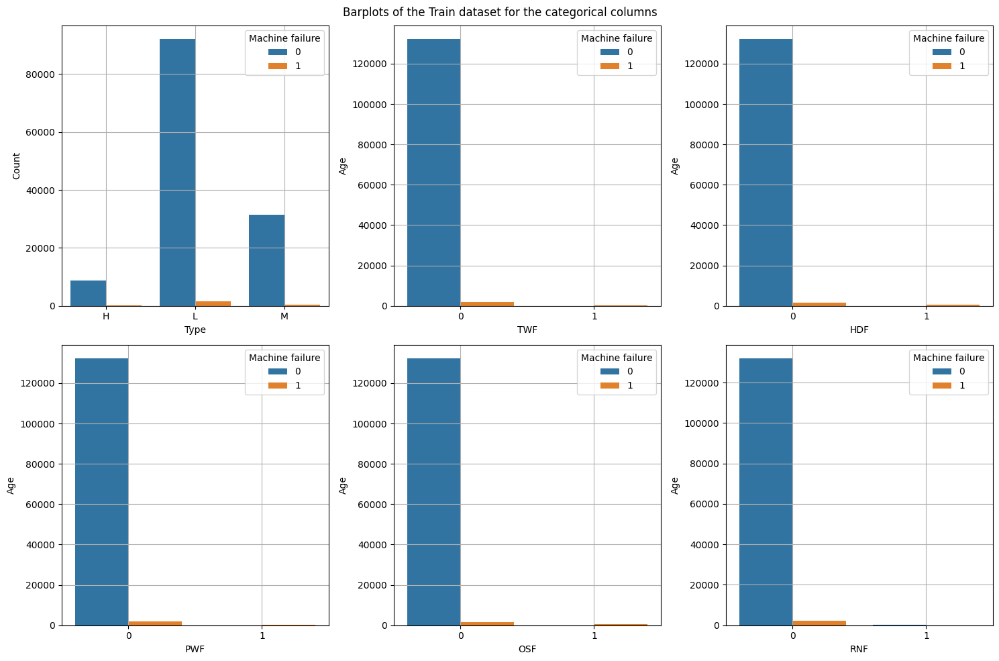

In [31]:
# Set up the figure and axes
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Scatterplot for Length
sns.barplot(data=grouped_data_type, x='Type', y='Count', hue='Machine failure', ax=axes[0, 0])
axes[0, 0].set_xlabel('Type')
axes[0, 0].set_ylabel('Count')

# Scatterplot for Weight
sns.barplot(data=grouped_data_twf, x='TWF', y='Count', hue='Machine failure', ax=axes[0, 1])
axes[0, 1].set_xlabel('TWF')
axes[0, 1].set_ylabel('Age')

# Scatterplot for Height
sns.barplot(data=grouped_data_hdf, x='HDF', y='Count', hue='Machine failure', ax=axes[0, 2])
axes[0, 2].set_xlabel('HDF')
axes[0, 2].set_ylabel('Age')

# Scatterplot for Viscera weight
sns.barplot(data=grouped_data_pwf, x='PWF', y='Count', hue='Machine failure', ax=axes[1, 0])
axes[1, 0].set_xlabel('PWF')
axes[1, 0].set_ylabel('Age')

# Scatterplot for Shucked weight
sns.barplot(data=grouped_data_osf, x='OSF', y='Count', hue='Machine failure', ax=axes[1, 1])
axes[1, 1].set_xlabel('OSF')
axes[1, 1].set_ylabel('Age')

# Scatterplot for Shell weight
sns.barplot(data=grouped_data_rnf, x='RNF', y='Count', hue='Machine failure', ax=axes[1, 2])
axes[1, 2].set_xlabel('RNF')
axes[1, 2].set_ylabel('Age')

# Add overall title
fig.suptitle('Barplots of the Train dataset for the categorical columns')

# Add gridlines to all subplots
for ax in axes.flat:
    ax.grid(True)

# Adjust the spacing between subplots
fig.tight_layout()

# Display the plot
plt.show()

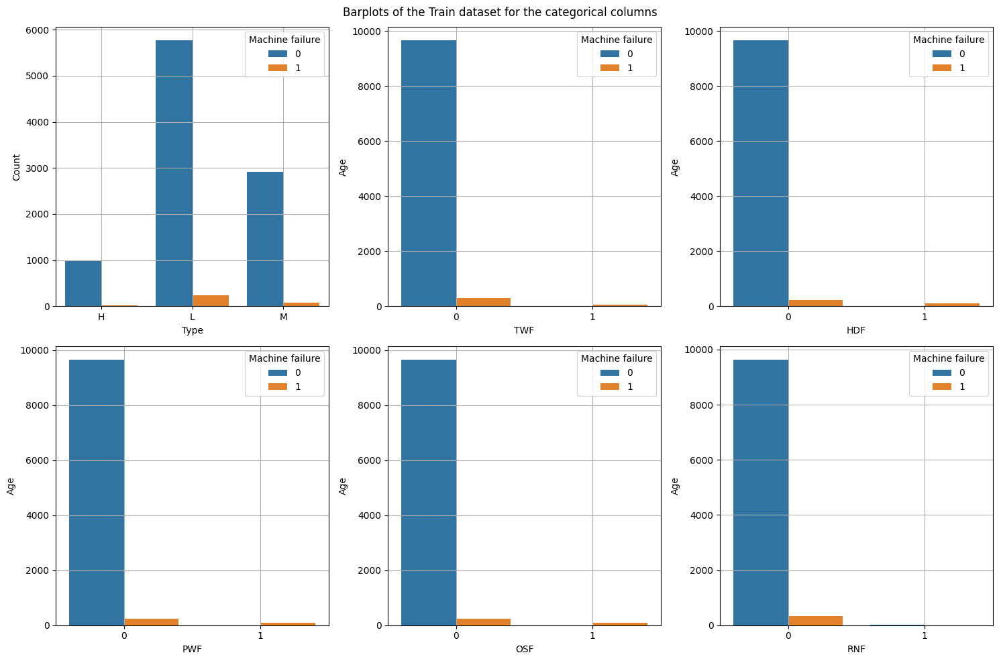

In [32]:
# Set up the figure and axes
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Scatterplot for Length
sns.barplot(data=grouped_data_type_original, x='Type', y='Count', hue='Machine failure', ax=axes[0, 0])
axes[0, 0].set_xlabel('Type')
axes[0, 0].set_ylabel('Count')

# Scatterplot for Weight
sns.barplot(data=grouped_data_twf_original, x='TWF', y='Count', hue='Machine failure', ax=axes[0, 1])
axes[0, 1].set_xlabel('TWF')
axes[0, 1].set_ylabel('Age')

# Scatterplot for Height
sns.barplot(data=grouped_data_hdf_original, x='HDF', y='Count', hue='Machine failure', ax=axes[0, 2])
axes[0, 2].set_xlabel('HDF')
axes[0, 2].set_ylabel('Age')

# Scatterplot for Viscera weight
sns.barplot(data=grouped_data_pwf_original, x='PWF', y='Count', hue='Machine failure', ax=axes[1, 0])
axes[1, 0].set_xlabel('PWF')
axes[1, 0].set_ylabel('Age')

# Scatterplot for Shucked weight
sns.barplot(data=grouped_data_osf_original, x='OSF', y='Count', hue='Machine failure', ax=axes[1, 1])
axes[1, 1].set_xlabel('OSF')
axes[1, 1].set_ylabel('Age')

# Scatterplot for Shell weight
sns.barplot(data=grouped_data_rnf_original, x='RNF', y='Count', hue='Machine failure', ax=axes[1, 2])
axes[1, 2].set_xlabel('RNF')
axes[1, 2].set_ylabel('Age')

# Add overall title
fig.suptitle('Barplots of the Train dataset for the categorical columns')

# Add gridlines to all subplots
for ax in axes.flat:
    ax.grid(True)

# Adjust the spacing between subplots
fig.tight_layout()

<h3><b>Plotting the Numeric columns</b></h3>

Text(0.5, 0.98, 'Pairplots of the Train dataset for the numerical columns')

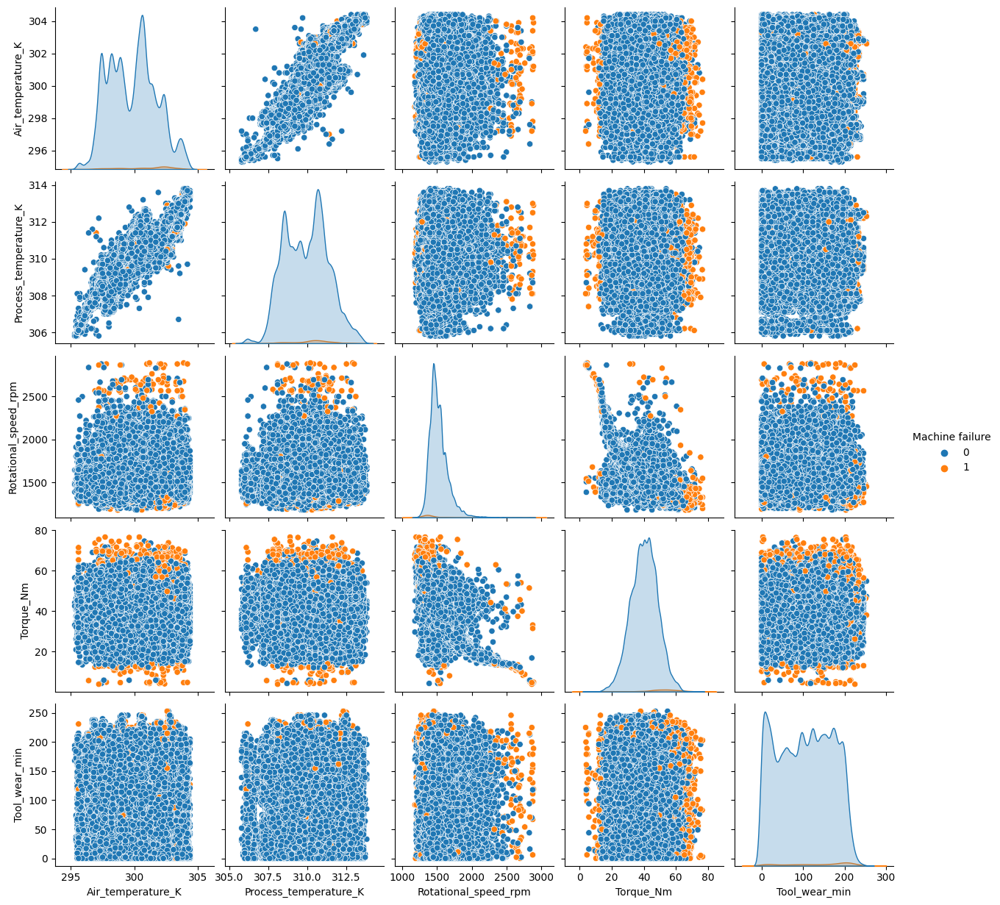

In [33]:
numeric_features = ['Air_temperature_K', 'Process_temperature_K', 'Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min', 'Machine failure']

numeric_df1 = train[numeric_features]

sns.pairplot(numeric_df1, hue='Machine failure')

# Add overall title
fig.suptitle('Pairplots of the Train dataset for the numerical columns')

Text(0.5, 0.98, 'Pairplots of the Train dataset for the numerical columns')

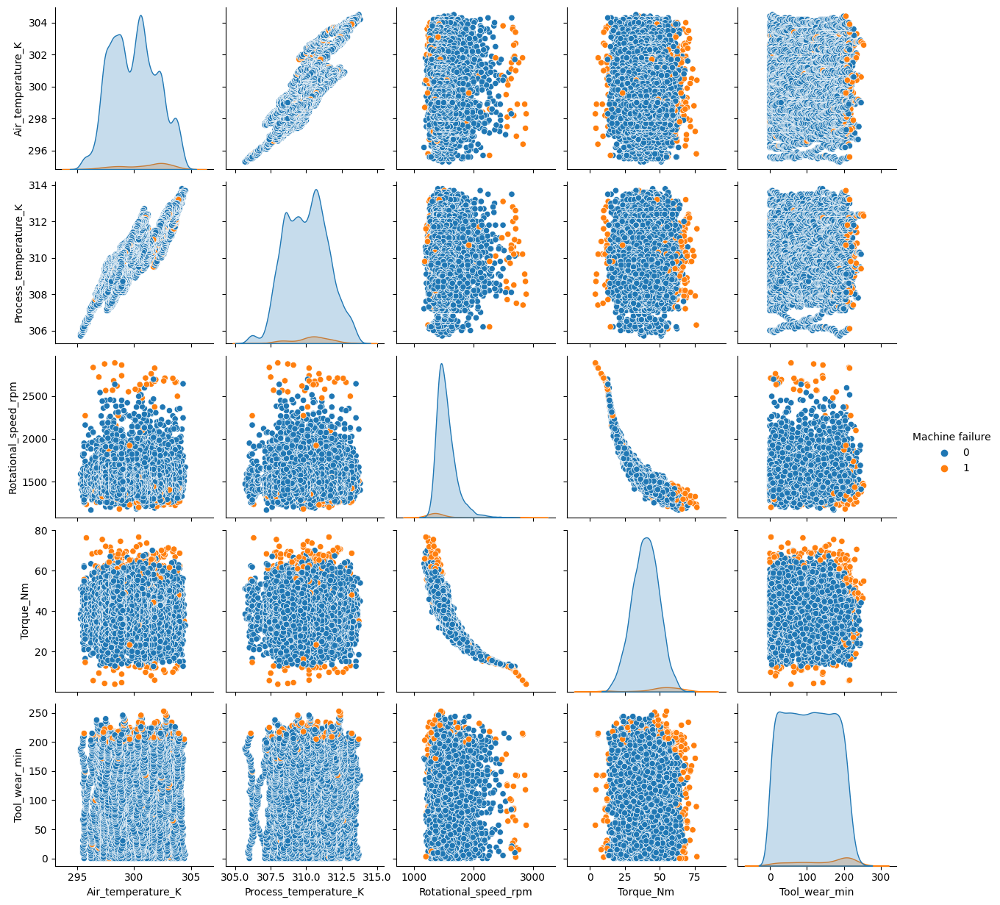

In [34]:
numeric_df2 = original[numeric_features]

sns.pairplot(numeric_df2, hue='Machine failure')

# Add overall title
fig.suptitle('Pairplots of the Train dataset for the numerical columns')

<h3><b>Comparing train and test dataset</b></h3>

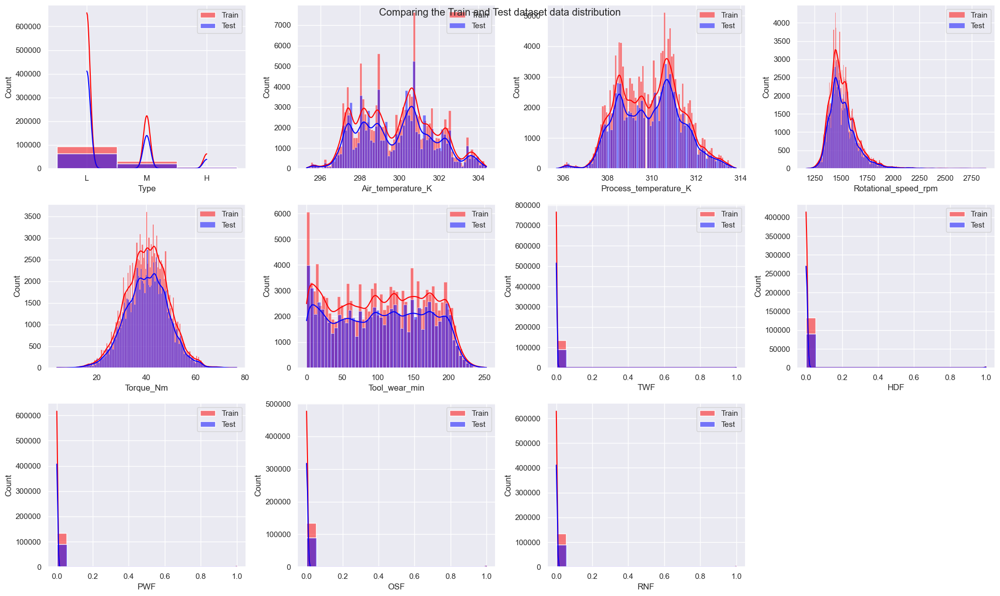

In [35]:
sns.set(style='darkgrid')

train_features = train.drop(columns=["Product ID","Machine failure"], axis=1)

# Set up the figure and axes
fig, axes = plt.subplots(3, 4, figsize=(20, 12))

# Flatten the axes for ease of iteration
axes = axes.flatten()

for i, feature in enumerate(train_features.columns):
    sns.histplot(data=train_features, x=feature, kde=True, color='Red', ax=axes[i], label='Train')
    sns.histplot(data=test, x=feature, kde=True, color='Blue', ax=axes[i], label='Test')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Count')
    axes[i].legend()
 
axes[-1].remove()

fig.tight_layout()

# Add overall title
fig.suptitle('Comparing the Train and Test dataset data distribution')

plt.show()

<h3><b>Reordering the column</b></h3>

In [36]:
# Reorder the columns
column_order = [col for col in train.columns if col != 'Machine failure'] + ['Machine failure']
train = train[column_order]

train.head()

,Product ID,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,TWF,HDF,PWF,OSF,RNF,Machine failure
0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0


In [37]:
# Reorder the columns
column_order = [col for col in original.columns if col != 'Machine failure'] + ['Machine failure']
original = original[column_order]

original.tail()

,Product ID,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,TWF,HDF,PWF,OSF,RNF,Machine failure
9995,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0
9999,M24859,M,299.0,308.7,1500,40.2,30,0,0,0,0,0,0


<h3><b>Converting the categorical columns to numerical values</b></h3>

In [38]:
categories = ['L', 'M', 'H']

# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Fit the encoder on the categories list
label_encoder.fit(categories)

# Transform the labels column in the training dataset
train["Type"] = label_encoder.transform(train[["Type"]])

train.head()

,Product ID,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,TWF,HDF,PWF,OSF,RNF,Machine failure
0,L50096,1,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,M20343,2,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,L49454,1,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,L53355,1,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,M24050,2,298.0,309.0,1641,35.4,34,0,0,0,0,0,0


In [39]:
# Transform the labels column in the training dataset
original["Type"] = label_encoder.transform(original[["Type"]])

original.head()

,Product ID,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,TWF,HDF,PWF,OSF,RNF,Machine failure
0,M14860,2,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,L47181,1,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,L47182,1,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,L47183,1,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,L47184,1,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [40]:
# Transform the labels column in the training dataset
test["Type"] = label_encoder.transform(test[["Type"]])

test.head()

,id,Product ID,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,TWF,HDF,PWF,OSF,RNF
0,136429,L50896,1,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,1,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,1,301.3,310.4,1525,37.7,96,0,0,0,0,0
3,136432,M21232,2,300.1,309.6,1479,47.6,5,0,0,0,0,0
4,136433,M19751,2,303.4,312.3,1515,41.3,114,0,0,0,0,0


<h3><b>Combining the train and the original dataset for better model performance</b></h3>

In [41]:
combined_df = pd.concat([train, original], axis=0)

<h3><b>Checking the Correlation among the dataset features and target variable</b><h3>

In [42]:
correlation_matrix = combined_df.corr(numeric_only=True)

target_correlation = correlation_matrix['Machine failure']

print(target_correlation)

Type                    -0.004717
Air_temperature_K        0.070319
Process_temperature_K    0.032206
Rotational_speed_rpm    -0.058378
Torque_Nm                0.151048
Tool_wear_min            0.060925
TWF                      0.317297
HDF                      0.569658
PWF                      0.403231
OSF                      0.499709
RNF                      0.001712
Machine failure          1.000000
Name: Machine failure, dtype: float64


In [43]:
# Calculate Pearson correlation
pearson_corr = combined_df.corr(method='pearson', numeric_only=True)

# Create a mask to hide the upper triangle
pearson_mask = np.triu(np.ones_like(pearson_corr, dtype=bool))

# Calculate Spearman correlation
spearman_corr = combined_df.corr(method='spearman', numeric_only=True)

# Create a mask to hide the upper triangle
spearman_mask = np.triu(np.ones_like(spearman_corr, dtype=bool))

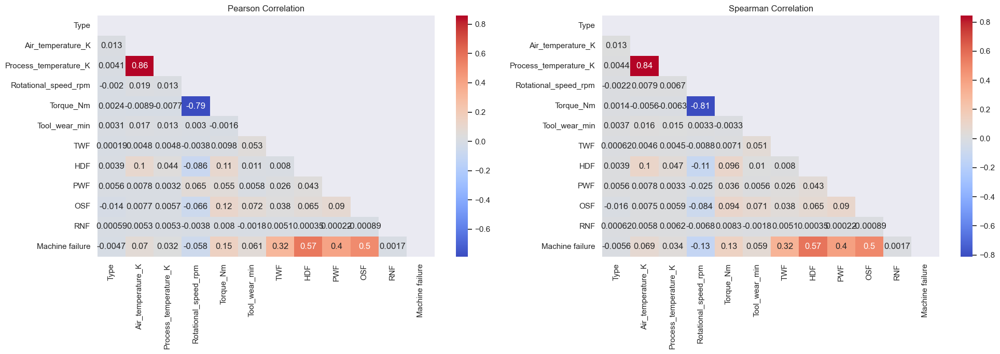

In [44]:
# Create a figure with two subplots in a row
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Plot Pearson correlation heatmap
sns.heatmap(pearson_corr, annot=True, cmap='coolwarm', mask=pearson_mask, ax=axes[0])
axes[0].set_title('Pearson Correlation')

# Plot Spearman correlation heatmap
sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', mask=spearman_mask, ax=axes[1])
axes[1].set_title('Spearman Correlation')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

<h3><b>Feature Selection</b></h3>

In [45]:
X = combined_df.drop(columns=["Machine failure", "Product ID"], axis=1)
Y = combined_df["Machine failure"]

# Print the shapes of X and Y
print("Shape of X:", X.shape)
print("Shape of Y:", Y.shape)

Shape of X: (144431, 11)
Shape of Y: (144431,)


In [46]:
# Split the dataset into training and testing subsets
X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

<h3><b>Checking the baseline models performance on the dataset</b></h3>

In [47]:
# Define the classifiers
classifiers = [
    CatBoostClassifier(verbose=False),
    XGBClassifier(),
    LGBMClassifier(),
    LogisticRegression(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    GradientBoostingClassifier(),
    GaussianNB(),
    SGDClassifier(),
    MLPClassifier(),
    QuadraticDiscriminantAnalysis(),
    BernoulliNB(),
    ExtraTreesClassifier(),
    PassiveAggressiveClassifier(),
    BaggingClassifier(),
    VotingClassifier(estimators=[('lr', LogisticRegression()), ('rf', RandomForestClassifier()), ('gnb', GaussianNB())]),
    CalibratedClassifierCV(base_estimator=RandomForestClassifier()),
    HistGradientBoostingClassifier()
]

# Fit the classifiers and make predictions
for classifier in classifiers:
    # Check if the classifier has predict_proba method
    if hasattr(classifier, 'predict_proba'):
        # Fit the classifier
        classifier.fit(X_train, y_train)
        
        # Make predictions
        y_pred_proba = classifier.predict_proba(X_val)[:, 1]
        
        # Calculate and print the ROC AUC score
        roc_auc = roc_auc_score(y_val, y_pred_proba)
        print(f"{classifier.__class__.__name__}: ROC AUC = {roc_auc:.4f}")

CatBoostClassifier: ROC AUC = 0.9602
XGBClassifier: ROC AUC = 0.9649
LGBMClassifier: ROC AUC = 0.9667
LogisticRegression: ROC AUC = 0.9420
KNeighborsClassifier: ROC AUC = 0.7539
DecisionTreeClassifier: ROC AUC = 0.8987
RandomForestClassifier: ROC AUC = 0.9465
GradientBoostingClassifier: ROC AUC = 0.9628
GaussianNB: ROC AUC = 0.9486
MLPClassifier: ROC AUC = 0.9477
QuadraticDiscriminantAnalysis: ROC AUC = 0.9536
BernoulliNB: ROC AUC = 0.8982
ExtraTreesClassifier: ROC AUC = 0.9403
BaggingClassifier: ROC AUC = 0.9201
CalibratedClassifierCV: ROC AUC = 0.9547
HistGradientBoostingClassifier: ROC AUC = 0.9643


<h3><b>Using optuna with StratifiedKFold to find the best hyperparameter for the model</b></h3>

In [49]:
# Convert X and Y to numpy arrays
X = X.values
Y = Y.values

# Define the objective function for Optuna
def objective(trial):
    params = {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 10, 200),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'verbose': 2,
        'random_state': 42
    }
    
    model = LGBMClassifier(**params)

    # Define the number of folds for stratified k-fold cross-validation
    n_splits = 5

    # Initialize an array to store the cross-validated AUC-ROC scores
    cv_scores = []

    # Create the stratified k-fold cross-validation iterator
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Perform stratified k-fold cross-validation
    for train_index, test_index in kf.split(X, Y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]
        
        model.fit(X_train, y_train)
        
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        
        auc_roc = roc_auc_score(y_test, y_pred_proba)
        
        cv_scores.append(auc_roc)

    mean_auc_roc = np.mean(cv_scores)

    return mean_auc_roc

# Run the hyperparameter optimization using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Get the best set of hyperparameters found by Optuna
best_params = study.best_params

final_model = LGBMClassifier(**best_params)

final_model.fit(X, Y)

[I 2023-06-24 01:43:56,551] A new study created in memory with name: no-name-db3d7f84-c421-4842-a254-b02422f6dc41


[LightGBM] [Warning] feature_fraction is set=0.3615674408697629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3615674408697629
[LightGBM] [Warning] bagging_fraction is set=0.5773822612992041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5773822612992041
[LightGBM] [Warning] lambda_l1 is set=3.561265815648366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.561265815648366
[LightGBM] [Warning] lambda_l2 is set=6.821431066521695e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.821431066521695e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.3615674408697629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3615674408697629
[LightGBM] [Warning] bagging_fraction is set=0.5773822612992041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5773822612992041
[LightGBM] [Warning

[I 2023-06-24 01:44:03,938] Trial 0 finished with value: 0.9655157089652644 and parameters: {'num_leaves': 48, 'learning_rate': 0.014592809939016805, 'feature_fraction': 0.3615674408697629, 'bagging_fraction': 0.5773822612992041, 'bagging_freq': 6, 'min_child_samples': 86, 'lambda_l1': 3.561265815648366, 'lambda_l2': 6.821431066521695e-08}. Best is trial 0 with value: 0.9655157089652644.


[LightGBM] [Warning] feature_fraction is set=0.3829347116077527, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3829347116077527
[LightGBM] [Warning] bagging_fraction is set=0.26229839476793865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26229839476793865
[LightGBM] [Warning] lambda_l1 is set=0.0006240098449615943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006240098449615943
[LightGBM] [Warning] lambda_l2 is set=0.057088935717993845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.057088935717993845
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.3829347116077527, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3829347116077527
[LightGBM] [Warning] bagging_fraction is set=0.26229839476793865, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26229839476793865
[LightGBM

[I 2023-06-24 01:44:11,072] Trial 1 finished with value: 0.968357164212466 and parameters: {'num_leaves': 18, 'learning_rate': 0.02709539158886868, 'feature_fraction': 0.3829347116077527, 'bagging_fraction': 0.26229839476793865, 'bagging_freq': 5, 'min_child_samples': 63, 'lambda_l1': 0.0006240098449615943, 'lambda_l2': 0.057088935717993845}. Best is trial 1 with value: 0.968357164212466.


[LightGBM] [Debug] Re-bagging, using 30333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 11
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 12
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 7
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 11
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 10
[LightGBM] [Warning] feature_fraction is set=0.5164306660799567, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5164306660799567
[LightGBM] [Warning] bagging_fraction is set=0.6254875462781838, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6254875462781838
[LightGBM] [Warning] lambda_l1 is set=2.3855252271718417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3855252271718417
[LightGBM] [Warning] lambda_l2 is set=0.41105774641225745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.41105774641225745
[LightGBM] [Warning] bagging_freq is set=6, 

[I 2023-06-24 01:44:21,664] Trial 2 finished with value: 0.9695977687425635 and parameters: {'num_leaves': 127, 'learning_rate': 0.02954327032524499, 'feature_fraction': 0.5164306660799567, 'bagging_fraction': 0.6254875462781838, 'bagging_freq': 6, 'min_child_samples': 4, 'lambda_l1': 2.3855252271718417, 'lambda_l2': 0.41105774641225745}. Best is trial 2 with value: 0.9695977687425635.


[LightGBM] [Warning] feature_fraction is set=0.875563647519968, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.875563647519968
[LightGBM] [Warning] bagging_fraction is set=0.6265793060575324, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6265793060575324
[LightGBM] [Warning] lambda_l1 is set=0.0001685973827541489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001685973827541489
[LightGBM] [Warning] lambda_l2 is set=0.013614473085046474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013614473085046474
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.875563647519968, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.875563647519968
[LightGBM] [Warning] bagging_fraction is set=0.6265793060575324, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6265793060575324
[LightGBM] [Warni

[I 2023-06-24 01:44:41,517] Trial 3 finished with value: 0.9665720546722956 and parameters: {'num_leaves': 180, 'learning_rate': 0.0425925558184323, 'feature_fraction': 0.875563647519968, 'bagging_fraction': 0.6265793060575324, 'bagging_freq': 9, 'min_child_samples': 94, 'lambda_l1': 0.0001685973827541489, 'lambda_l2': 0.013614473085046474}. Best is trial 2 with value: 0.9695977687425635.


[LightGBM] [Warning] feature_fraction is set=0.3238111992101443, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3238111992101443
[LightGBM] [Warning] bagging_fraction is set=0.36831368067463566, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36831368067463566
[LightGBM] [Warning] lambda_l1 is set=0.6147632293555186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6147632293555186
[LightGBM] [Warning] lambda_l2 is set=0.11731440392677486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11731440392677486
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.3238111992101443, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3238111992101443
[LightGBM] [Warning] bagging_fraction is set=0.36831368067463566, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36831368067463566
[LightGBM] [Warni

[I 2023-06-24 01:44:55,680] Trial 4 finished with value: 0.971914460539745 and parameters: {'num_leaves': 160, 'learning_rate': 0.059248882052508535, 'feature_fraction': 0.3238111992101443, 'bagging_fraction': 0.36831368067463566, 'bagging_freq': 4, 'min_child_samples': 64, 'lambda_l1': 0.6147632293555186, 'lambda_l2': 0.11731440392677486}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Warning] feature_fraction is set=0.8252954260937694, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8252954260937694
[LightGBM] [Warning] bagging_fraction is set=0.6916781532989171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6916781532989171
[LightGBM] [Warning] lambda_l1 is set=9.258184029759207e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.258184029759207e-08
[LightGBM] [Warning] lambda_l2 is set=0.23862591648512071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23862591648512071
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.8252954260937694, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8252954260937694
[LightGBM] [Warning] bagging_fraction is set=0.6916781532989171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6916781532989171
[LightGBM] [War

[I 2023-06-24 01:45:07,902] Trial 5 finished with value: 0.9693765375060673 and parameters: {'num_leaves': 84, 'learning_rate': 0.01629798015066902, 'feature_fraction': 0.8252954260937694, 'bagging_fraction': 0.6916781532989171, 'bagging_freq': 7, 'min_child_samples': 14, 'lambda_l1': 9.258184029759207e-08, 'lambda_l2': 0.23862591648512071}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Warning] feature_fraction is set=0.624485669842518, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.624485669842518
[LightGBM] [Warning] bagging_fraction is set=0.11245072392455034, subsample=1.0 will be ignored. Current value: bagging_fraction=0.11245072392455034
[LightGBM] [Warning] lambda_l1 is set=1.0659534775836805e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0659534775836805e-07
[LightGBM] [Warning] lambda_l2 is set=0.0142812304743074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0142812304743074
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.624485669842518, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.624485669842518
[LightGBM] [Warning] bagging_fraction is set=0.11245072392455034, subsample=1.0 will be ignored. Current value: bagging_fraction=0.11245072392455034
[LightGBM] [W

[I 2023-06-24 01:45:16,898] Trial 6 finished with value: 0.9696815867872143 and parameters: {'num_leaves': 120, 'learning_rate': 0.012500764462339643, 'feature_fraction': 0.624485669842518, 'bagging_fraction': 0.11245072392455034, 'bagging_freq': 10, 'min_child_samples': 48, 'lambda_l1': 1.0659534775836805e-07, 'lambda_l2': 0.0142812304743074}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Warning] feature_fraction is set=0.12926457353299697, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.12926457353299697
[LightGBM] [Warning] bagging_fraction is set=0.17867840073423974, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17867840073423974
[LightGBM] [Warning] lambda_l1 is set=1.574681920407709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.574681920407709
[LightGBM] [Warning] lambda_l2 is set=0.012308221876999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012308221876999
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.12926457353299697, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.12926457353299697
[LightGBM] [Warning] bagging_fraction is set=0.17867840073423974, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17867840073423974
[LightGBM] [Warni

[I 2023-06-24 01:45:20,698] Trial 7 finished with value: 0.9658766072382873 and parameters: {'num_leaves': 39, 'learning_rate': 0.026411844887876127, 'feature_fraction': 0.12926457353299697, 'bagging_fraction': 0.17867840073423974, 'bagging_freq': 10, 'min_child_samples': 51, 'lambda_l1': 1.574681920407709, 'lambda_l2': 0.012308221876999}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1
[LightGBM] [Warning] No further splits with positive gain, b

[I 2023-06-24 01:45:26,025] Trial 8 finished with value: 0.9694399487468832 and parameters: {'num_leaves': 18, 'learning_rate': 0.0711922962056407, 'feature_fraction': 0.18270034928852932, 'bagging_fraction': 0.626867645471671, 'bagging_freq': 1, 'min_child_samples': 61, 'lambda_l1': 0.178284019658535, 'lambda_l2': 0.3361386402765653}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Warning] feature_fraction is set=0.14540410176506208, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14540410176506208
[LightGBM] [Warning] bagging_fraction is set=0.20477757782323883, subsample=1.0 will be ignored. Current value: bagging_fraction=0.20477757782323883
[LightGBM] [Warning] lambda_l1 is set=0.0001654703730272815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001654703730272815
[LightGBM] [Warning] lambda_l2 is set=6.21754758285033e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.21754758285033e-05
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.14540410176506208, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14540410176506208
[LightGBM] [Warning] bagging_fraction is set=0.20477757782323883, subsample=1.0 will be ignored. Current value: bagging_fraction=0.20477757782323883
[Ligh

[I 2023-06-24 01:45:32,423] Trial 9 finished with value: 0.968924401140626 and parameters: {'num_leaves': 52, 'learning_rate': 0.018620925671252057, 'feature_fraction': 0.14540410176506208, 'bagging_fraction': 0.20477757782323883, 'bagging_freq': 6, 'min_child_samples': 56, 'lambda_l1': 0.0001654703730272815, 'lambda_l2': 6.21754758285033e-05}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 14
[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 14
[LightGBM] [Warning] feature_fraction is set=0.9707236749099066, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9707236749099066
[LightGBM] [Warning] bagging_fraction is set=0.9791102014324601, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9791102014324601
[LightGBM] [Warning] lambda_l1 is set=0.03805131841425917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03805131841425917
[LightGBM] [Warning] lambda_l2 is set=9.812576597013893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.812576597013893
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9707236749099066, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9707236749099066
[LightGBM] [Warning] bagging_fraction 

[I 2023-06-24 01:45:48,533] Trial 10 finished with value: 0.9683740163759836 and parameters: {'num_leaves': 199, 'learning_rate': 0.08146036775695685, 'feature_fraction': 0.9707236749099066, 'bagging_fraction': 0.9791102014324601, 'bagging_freq': 2, 'min_child_samples': 30, 'lambda_l1': 0.03805131841425917, 'lambda_l2': 9.812576597013893}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Warning] feature_fraction is set=0.6649994622953871, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6649994622953871
[LightGBM] [Warning] bagging_fraction is set=0.34369843956850227, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34369843956850227
[LightGBM] [Warning] lambda_l1 is set=2.3684748577119297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3684748577119297e-08
[LightGBM] [Warning] lambda_l2 is set=0.00045584849709327596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00045584849709327596
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6649994622953871, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6649994622953871
[LightGBM] [Warning] bagging_fraction is set=0.34369843956850227, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34369843956850227
[Li

[I 2023-06-24 01:45:59,641] Trial 11 finished with value: 0.9713871849553994 and parameters: {'num_leaves': 142, 'learning_rate': 0.010208495318504688, 'feature_fraction': 0.6649994622953871, 'bagging_fraction': 0.34369843956850227, 'bagging_freq': 3, 'min_child_samples': 33, 'lambda_l1': 2.3684748577119297e-08, 'lambda_l2': 0.00045584849709327596}. Best is trial 4 with value: 0.971914460539745.


[LightGBM] [Warning] feature_fraction is set=0.6408810927675765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408810927675765
[LightGBM] [Warning] bagging_fraction is set=0.38347804573678207, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38347804573678207
[LightGBM] [Warning] lambda_l1 is set=1.2985294477158866e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2985294477158866e-08
[LightGBM] [Warning] lambda_l2 is set=0.0004589748057298153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004589748057298153
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6408810927675765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408810927675765
[LightGBM] [Warning] bagging_fraction is set=0.38347804573678207, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38347804573678207
[Ligh

[I 2023-06-24 01:46:10,916] Trial 12 finished with value: 0.9723105281676794 and parameters: {'num_leaves': 153, 'learning_rate': 0.010330258578164579, 'feature_fraction': 0.6408810927675765, 'bagging_fraction': 0.38347804573678207, 'bagging_freq': 3, 'min_child_samples': 32, 'lambda_l1': 1.2985294477158866e-08, 'lambda_l2': 0.0004589748057298153}. Best is trial 12 with value: 0.9723105281676794.


[LightGBM] [Warning] feature_fraction is set=0.4804051613304893, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4804051613304893
[LightGBM] [Warning] bagging_fraction is set=0.39875657252814733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39875657252814733
[LightGBM] [Warning] lambda_l1 is set=8.415692421663538e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.415692421663538e-07
[LightGBM] [Warning] lambda_l2 is set=0.00010559258834770045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010559258834770045
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4804051613304893, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4804051613304893
[LightGBM] [Warning] bagging_fraction is set=0.39875657252814733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39875657252814733
[Ligh

[I 2023-06-24 01:46:22,831] Trial 13 finished with value: 0.9723416844019075 and parameters: {'num_leaves': 157, 'learning_rate': 0.04903557542555362, 'feature_fraction': 0.4804051613304893, 'bagging_fraction': 0.39875657252814733, 'bagging_freq': 4, 'min_child_samples': 77, 'lambda_l1': 8.415692421663538e-07, 'lambda_l2': 0.00010559258834770045}. Best is trial 13 with value: 0.9723416844019075.


[LightGBM] [Warning] feature_fraction is set=0.4875285695949602, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4875285695949602
[LightGBM] [Warning] bagging_fraction is set=0.4236629600116493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4236629600116493
[LightGBM] [Warning] lambda_l1 is set=9.553344120446963e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.553344120446963e-07
[LightGBM] [Warning] lambda_l2 is set=3.713268778726569e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.713268778726569e-05
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.4875285695949602, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4875285695949602
[LightGBM] [Warning] bagging_fraction is set=0.4236629600116493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4236629600116493
[LightGBM] 

[I 2023-06-24 01:46:32,474] Trial 14 finished with value: 0.9721547937821212 and parameters: {'num_leaves': 95, 'learning_rate': 0.044741539526201315, 'feature_fraction': 0.4875285695949602, 'bagging_fraction': 0.4236629600116493, 'bagging_freq': 3, 'min_child_samples': 75, 'lambda_l1': 9.553344120446963e-07, 'lambda_l2': 3.713268778726569e-05}. Best is trial 13 with value: 0.9723416844019075.


[LightGBM] [Warning] feature_fraction is set=0.6928173434016636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6928173434016636
[LightGBM] [Warning] bagging_fraction is set=0.45656576863816417, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45656576863816417
[LightGBM] [Warning] lambda_l1 is set=1.815196317525648e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.815196317525648e-06
[LightGBM] [Warning] lambda_l2 is set=1.2598906752617636e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2598906752617636e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6928173434016636, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6928173434016636
[LightGBM] [Warning] bagging_fraction is set=0.45656576863816417, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45656576863816417
[Ligh

[I 2023-06-24 01:46:45,857] Trial 15 finished with value: 0.9663788152604946 and parameters: {'num_leaves': 155, 'learning_rate': 0.09963802197349927, 'feature_fraction': 0.6928173434016636, 'bagging_fraction': 0.45656576863816417, 'bagging_freq': 4, 'min_child_samples': 38, 'lambda_l1': 1.815196317525648e-06, 'lambda_l2': 1.2598906752617636e-05}. Best is trial 13 with value: 0.9723416844019075.


[LightGBM] [Warning] feature_fraction is set=0.5791076108439408, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5791076108439408
[LightGBM] [Warning] bagging_fraction is set=0.4939935887061161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4939935887061161
[LightGBM] [Warning] lambda_l1 is set=1.2300005705327026e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2300005705327026e-08
[LightGBM] [Warning] lambda_l2 is set=2.234304410424288e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.234304410424288e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5791076108439408, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5791076108439408
[LightGBM] [Warning] bagging_fraction is set=0.4939935887061161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4939935887061161
[LightGBM

[I 2023-06-24 01:47:00,312] Trial 16 finished with value: 0.9728695720700434 and parameters: {'num_leaves': 182, 'learning_rate': 0.021299041321021207, 'feature_fraction': 0.5791076108439408, 'bagging_fraction': 0.4939935887061161, 'bagging_freq': 1, 'min_child_samples': 77, 'lambda_l1': 1.2300005705327026e-08, 'lambda_l2': 2.234304410424288e-06}. Best is trial 16 with value: 0.9728695720700434.


[LightGBM] [Warning] feature_fraction is set=0.48510974770739934, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48510974770739934
[LightGBM] [Warning] bagging_fraction is set=0.49703345248078457, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49703345248078457
[LightGBM] [Warning] lambda_l1 is set=3.6028442760017637e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6028442760017637e-06
[LightGBM] [Warning] lambda_l2 is set=1.393990896382811e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.393990896382811e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.48510974770739934, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48510974770739934
[LightGBM] [Warning] bagging_fraction is set=0.49703345248078457, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49703345248078457
[

[I 2023-06-24 01:47:14,338] Trial 17 finished with value: 0.9741657417400698 and parameters: {'num_leaves': 187, 'learning_rate': 0.021490016066730344, 'feature_fraction': 0.48510974770739934, 'bagging_fraction': 0.49703345248078457, 'bagging_freq': 1, 'min_child_samples': 78, 'lambda_l1': 3.6028442760017637e-06, 'lambda_l2': 1.393990896382811e-06}. Best is trial 17 with value: 0.9741657417400698.


[LightGBM] [Warning] feature_fraction is set=0.5825516080189255, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5825516080189255
[LightGBM] [Warning] bagging_fraction is set=0.49941373601699696, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49941373601699696
[LightGBM] [Warning] lambda_l1 is set=8.690205552285769e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.690205552285769e-06
[LightGBM] [Warning] lambda_l2 is set=1.023248153199519e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.023248153199519e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5825516080189255, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5825516080189255
[LightGBM] [Warning] bagging_fraction is set=0.49941373601699696, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49941373601699696
[LightG

[I 2023-06-24 01:47:29,296] Trial 18 finished with value: 0.9729237327897609 and parameters: {'num_leaves': 200, 'learning_rate': 0.021059895427687603, 'feature_fraction': 0.5825516080189255, 'bagging_fraction': 0.49941373601699696, 'bagging_freq': 1, 'min_child_samples': 77, 'lambda_l1': 8.690205552285769e-06, 'lambda_l2': 1.023248153199519e-06}. Best is trial 17 with value: 0.9741657417400698.


[LightGBM] [Warning] feature_fraction is set=0.7519150327453462, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7519150327453462
[LightGBM] [Warning] bagging_fraction is set=0.5198057763992602, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5198057763992602
[LightGBM] [Warning] lambda_l1 is set=1.0938603274919317e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0938603274919317e-05
[LightGBM] [Warning] lambda_l2 is set=1.7454482935880175e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7454482935880175e-08
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7519150327453462, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7519150327453462
[LightGBM] [Warning] bagging_fraction is set=0.5198057763992602, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5198057763992602
[LightG

[I 2023-06-24 01:47:41,575] Trial 19 finished with value: 0.9703620276049645 and parameters: {'num_leaves': 195, 'learning_rate': 0.02212963078823109, 'feature_fraction': 0.7519150327453462, 'bagging_fraction': 0.5198057763992602, 'bagging_freq': 1, 'min_child_samples': 94, 'lambda_l1': 1.0938603274919317e-05, 'lambda_l2': 1.7454482935880175e-08}. Best is trial 17 with value: 0.9741657417400698.


[LightGBM] [Warning] feature_fraction is set=0.569044571947115, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.569044571947115
[LightGBM] [Warning] bagging_fraction is set=0.7412049340344332, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7412049340344332
[LightGBM] [Warning] lambda_l1 is set=1.4797175408495394e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4797175408495394e-05
[LightGBM] [Warning] lambda_l2 is set=7.429678603217828e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.429678603217828e-07
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.569044571947115, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.569044571947115
[LightGBM] [Warning] bagging_fraction is set=0.7412049340344332, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7412049340344332
[LightGBM] [W

[I 2023-06-24 01:47:55,965] Trial 20 finished with value: 0.9721401859342548 and parameters: {'num_leaves': 176, 'learning_rate': 0.03560766457354506, 'feature_fraction': 0.569044571947115, 'bagging_fraction': 0.7412049340344332, 'bagging_freq': 2, 'min_child_samples': 99, 'lambda_l1': 1.4797175408495394e-05, 'lambda_l2': 7.429678603217828e-07}. Best is trial 17 with value: 0.9741657417400698.


[LightGBM] [Warning] feature_fraction is set=0.5808129852757832, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5808129852757832
[LightGBM] [Warning] bagging_fraction is set=0.5028873617411712, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5028873617411712
[LightGBM] [Warning] lambda_l1 is set=2.5811811987799517e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5811811987799517e-07
[LightGBM] [Warning] lambda_l2 is set=1.8144850145723635e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8144850145723635e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5808129852757832, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5808129852757832
[LightGBM] [Warning] bagging_fraction is set=0.5028873617411712, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5028873617411712
[LightG

[I 2023-06-24 01:48:07,567] Trial 21 finished with value: 0.9728491783817915 and parameters: {'num_leaves': 176, 'learning_rate': 0.021095575621506088, 'feature_fraction': 0.5808129852757832, 'bagging_fraction': 0.5028873617411712, 'bagging_freq': 1, 'min_child_samples': 76, 'lambda_l1': 2.5811811987799517e-07, 'lambda_l2': 1.8144850145723635e-06}. Best is trial 17 with value: 0.9741657417400698.


[LightGBM] [Warning] feature_fraction is set=0.43748647291839593, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.43748647291839593
[LightGBM] [Warning] bagging_fraction is set=0.4980079747043512, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4980079747043512
[LightGBM] [Warning] lambda_l1 is set=5.81970595322863e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.81970595322863e-06
[LightGBM] [Warning] lambda_l2 is set=6.109111626308605e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.109111626308605e-07
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.43748647291839593, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.43748647291839593
[LightGBM] [Warning] bagging_fraction is set=0.4980079747043512, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4980079747043512
[LightGBM

[I 2023-06-24 01:48:20,970] Trial 22 finished with value: 0.9745215963693781 and parameters: {'num_leaves': 187, 'learning_rate': 0.022920292410234612, 'feature_fraction': 0.43748647291839593, 'bagging_fraction': 0.4980079747043512, 'bagging_freq': 2, 'min_child_samples': 83, 'lambda_l1': 5.81970595322863e-06, 'lambda_l2': 6.109111626308605e-07}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.437151596480549, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.437151596480549
[LightGBM] [Warning] bagging_fraction is set=0.31815233482914373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.31815233482914373
[LightGBM] [Warning] lambda_l1 is set=1.5303209624648676e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5303209624648676e-05
[LightGBM] [Warning] lambda_l2 is set=1.8623274707912368e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8623274707912368e-07
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.437151596480549, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.437151596480549
[LightGBM] [Warning] bagging_fraction is set=0.31815233482914373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.31815233482914373
[LightG

[I 2023-06-24 01:48:33,189] Trial 23 finished with value: 0.9742489367131814 and parameters: {'num_leaves': 198, 'learning_rate': 0.02373399907454773, 'feature_fraction': 0.437151596480549, 'bagging_fraction': 0.31815233482914373, 'bagging_freq': 2, 'min_child_samples': 86, 'lambda_l1': 1.5303209624648676e-05, 'lambda_l2': 1.8623274707912368e-07}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.42885248599393505, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42885248599393505
[LightGBM] [Warning] bagging_fraction is set=0.31471463872776895, subsample=1.0 will be ignored. Current value: bagging_fraction=0.31471463872776895
[LightGBM] [Warning] lambda_l1 is set=3.7819960016410245e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7819960016410245e-05
[LightGBM] [Warning] lambda_l2 is set=1.0788918112965463e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0788918112965463e-07
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.42885248599393505, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42885248599393505
[LightGBM] [Warning] bagging_fraction is set=0.31471463872776895, subsample=1.0 will be ignored. Current value: bagging_fraction=0.31471463872776895

[I 2023-06-24 01:48:44,423] Trial 24 finished with value: 0.9735784102177597 and parameters: {'num_leaves': 134, 'learning_rate': 0.03241888669342637, 'feature_fraction': 0.42885248599393505, 'bagging_fraction': 0.31471463872776895, 'bagging_freq': 2, 'min_child_samples': 89, 'lambda_l1': 3.7819960016410245e-05, 'lambda_l2': 1.0788918112965463e-07}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.2793155759803251, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2793155759803251
[LightGBM] [Warning] bagging_fraction is set=0.2846172162465862, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2846172162465862
[LightGBM] [Warning] lambda_l1 is set=0.0009624399113833832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009624399113833832
[LightGBM] [Warning] lambda_l2 is set=1.2150241265733458e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2150241265733458e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.2793155759803251, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2793155759803251
[LightGBM] [Warning] bagging_fraction is set=0.2846172162465862, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2846172162465862
[LightGBM

[I 2023-06-24 01:48:55,137] Trial 25 finished with value: 0.9734123991331582 and parameters: {'num_leaves': 169, 'learning_rate': 0.024825208786953195, 'feature_fraction': 0.2793155759803251, 'bagging_fraction': 0.2846172162465862, 'bagging_freq': 2, 'min_child_samples': 85, 'lambda_l1': 0.0009624399113833832, 'lambda_l2': 1.2150241265733458e-08}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.4450104765061033, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4450104765061033
[LightGBM] [Warning] bagging_fraction is set=0.43983710059803877, subsample=1.0 will be ignored. Current value: bagging_fraction=0.43983710059803877
[LightGBM] [Warning] lambda_l1 is set=2.809861927728352e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.809861927728352e-06
[LightGBM] [Warning] lambda_l2 is set=1.6879982880179648e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6879982880179648e-07
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.4450104765061033, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4450104765061033
[LightGBM] [Warning] bagging_fraction is set=0.43983710059803877, subsample=1.0 will be ignored. Current value: bagging_fraction=0.43983710059803877
[Ligh

[I 2023-06-24 01:49:05,414] Trial 26 finished with value: 0.9732132522473499 and parameters: {'num_leaves': 108, 'learning_rate': 0.01711712548747804, 'feature_fraction': 0.4450104765061033, 'bagging_fraction': 0.43983710059803877, 'bagging_freq': 3, 'min_child_samples': 66, 'lambda_l1': 2.809861927728352e-06, 'lambda_l2': 1.6879982880179648e-07}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.41318448388471024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.41318448388471024
[LightGBM] [Warning] bagging_fraction is set=0.3271709996064187, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3271709996064187
[LightGBM] [Warning] lambda_l1 is set=5.361584441391486e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.361584441391486e-05
[LightGBM] [Warning] lambda_l2 is set=6.073881262573959e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.073881262573959e-06
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.41318448388471024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.41318448388471024
[LightGBM] [Warning] bagging_fraction is set=0.3271709996064187, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3271709996064187
[LightG

[I 2023-06-24 01:49:18,866] Trial 27 finished with value: 0.9731572025845747 and parameters: {'num_leaves': 188, 'learning_rate': 0.03510529269298443, 'feature_fraction': 0.41318448388471024, 'bagging_fraction': 0.3271709996064187, 'bagging_freq': 8, 'min_child_samples': 69, 'lambda_l1': 5.361584441391486e-05, 'lambda_l2': 6.073881262573959e-06}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.5075107108112731, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5075107108112731
[LightGBM] [Warning] bagging_fraction is set=0.2514857572849116, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2514857572849116
[LightGBM] [Warning] lambda_l1 is set=4.279366397724464e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279366397724464e-06
[LightGBM] [Warning] lambda_l2 is set=2.5362750210819297e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5362750210819297e-07
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.5075107108112731, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5075107108112731
[LightGBM] [Warning] bagging_fraction is set=0.2514857572849116, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2514857572849116
[LightGBM

[I 2023-06-24 01:49:31,382] Trial 28 finished with value: 0.9714647914983157 and parameters: {'num_leaves': 142, 'learning_rate': 0.02881471419577474, 'feature_fraction': 0.5075107108112731, 'bagging_fraction': 0.2514857572849116, 'bagging_freq': 5, 'min_child_samples': 100, 'lambda_l1': 4.279366397724464e-06, 'lambda_l2': 2.5362750210819297e-07}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.3562153805514182, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3562153805514182
[LightGBM] [Warning] bagging_fraction is set=0.5352800872535163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5352800872535163
[LightGBM] [Warning] lambda_l1 is set=4.7480808590860106e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7480808590860106e-07
[LightGBM] [Warning] lambda_l2 is set=3.5526694290609804e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5526694290609804e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.3562153805514182, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3562153805514182
[LightGBM] [Warning] bagging_fraction is set=0.5352800872535163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5352800872535163
[LightG

[I 2023-06-24 01:49:43,503] Trial 29 finished with value: 0.9712940474780257 and parameters: {'num_leaves': 79, 'learning_rate': 0.014970058785708198, 'feature_fraction': 0.3562153805514182, 'bagging_fraction': 0.5352800872535163, 'bagging_freq': 2, 'min_child_samples': 84, 'lambda_l1': 4.7480808590860106e-07, 'lambda_l2': 3.5526694290609804e-08}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.2753496647213872, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2753496647213872
[LightGBM] [Warning] bagging_fraction is set=0.5623311060549587, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5623311060549587
[LightGBM] [Warning] lambda_l1 is set=3.019940294465091e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.019940294465091e-06
[LightGBM] [Warning] lambda_l2 is set=9.049574572199895e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.049574572199895e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.2753496647213872, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2753496647213872
[LightGBM] [Warning] bagging_fraction is set=0.5623311060549587, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5623311060549587
[LightGBM] 

[I 2023-06-24 01:49:56,995] Trial 30 finished with value: 0.9739130605216045 and parameters: {'num_leaves': 166, 'learning_rate': 0.01904344495182848, 'feature_fraction': 0.2753496647213872, 'bagging_fraction': 0.5623311060549587, 'bagging_freq': 4, 'min_child_samples': 88, 'lambda_l1': 3.019940294465091e-06, 'lambda_l2': 9.049574572199895e-08}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.31062620878940017, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31062620878940017
[LightGBM] [Warning] bagging_fraction is set=0.5622304264945976, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5622304264945976
[LightGBM] [Warning] lambda_l1 is set=2.1006629214200946e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1006629214200946e-06
[LightGBM] [Warning] lambda_l2 is set=8.852318414388145e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852318414388145e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.31062620878940017, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31062620878940017
[LightGBM] [Warning] bagging_fraction is set=0.5622304264945976, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5622304264945976
[Ligh

[I 2023-06-24 01:50:11,144] Trial 31 finished with value: 0.9739345184539101 and parameters: {'num_leaves': 189, 'learning_rate': 0.018229321756678744, 'feature_fraction': 0.31062620878940017, 'bagging_fraction': 0.5622304264945976, 'bagging_freq': 4, 'min_child_samples': 88, 'lambda_l1': 2.1006629214200946e-06, 'lambda_l2': 8.852318414388145e-08}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.38955829393314, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38955829393314
[LightGBM] [Warning] bagging_fraction is set=0.435446409012756, subsample=1.0 will be ignored. Current value: bagging_fraction=0.435446409012756
[LightGBM] [Warning] lambda_l1 is set=3.096398914146784e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.096398914146784e-05
[LightGBM] [Warning] lambda_l2 is set=4.814092916705201e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.814092916705201e-07
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.38955829393314, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38955829393314
[LightGBM] [Warning] bagging_fraction is set=0.435446409012756, subsample=1.0 will be ignored. Current value: bagging_fraction=0.435446409012756
[LightGBM] [Warning] la

[I 2023-06-24 01:50:24,780] Trial 32 finished with value: 0.9713563668402208 and parameters: {'num_leaves': 185, 'learning_rate': 0.02481076144740162, 'feature_fraction': 0.38955829393314, 'bagging_fraction': 0.435446409012756, 'bagging_freq': 5, 'min_child_samples': 85, 'lambda_l1': 3.096398914146784e-05, 'lambda_l2': 4.814092916705201e-07}. Best is trial 22 with value: 0.9745215963693781.


[LightGBM] [Warning] feature_fraction is set=0.45477956720751955, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.45477956720751955
[LightGBM] [Warning] bagging_fraction is set=0.5917822349430368, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5917822349430368
[LightGBM] [Warning] lambda_l1 is set=5.593843628920159e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.593843628920159e-06
[LightGBM] [Warning] lambda_l2 is set=4.0912449169156195e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0912449169156195e-08
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.45477956720751955, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.45477956720751955
[LightGBM] [Warning] bagging_fraction is set=0.5917822349430368, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5917822349430368
[Ligh

[I 2023-06-24 01:50:38,467] Trial 33 finished with value: 0.9747709700506307 and parameters: {'num_leaves': 190, 'learning_rate': 0.013773760093280473, 'feature_fraction': 0.45477956720751955, 'bagging_fraction': 0.5917822349430368, 'bagging_freq': 3, 'min_child_samples': 71, 'lambda_l1': 5.593843628920159e-06, 'lambda_l2': 4.0912449169156195e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.5215740118660903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5215740118660903
[LightGBM] [Warning] bagging_fraction is set=0.37055274347029066, subsample=1.0 will be ignored. Current value: bagging_fraction=0.37055274347029066
[LightGBM] [Warning] lambda_l1 is set=8.602257085198782e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.602257085198782e-06
[LightGBM] [Warning] lambda_l2 is set=4.810919173177283e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.810919173177283e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5215740118660903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5215740118660903
[LightGBM] [Warning] bagging_fraction is set=0.37055274347029066, subsample=1.0 will be ignored. Current value: bagging_fraction=0.37055274347029066
[LightG

[I 2023-06-24 01:50:51,290] Trial 34 finished with value: 0.9738478923013527 and parameters: {'num_leaves': 176, 'learning_rate': 0.013203304363785185, 'feature_fraction': 0.5215740118660903, 'bagging_fraction': 0.37055274347029066, 'bagging_freq': 2, 'min_child_samples': 69, 'lambda_l1': 8.602257085198782e-06, 'lambda_l2': 4.810919173177283e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.44848400788353787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44848400788353787
[LightGBM] [Warning] bagging_fraction is set=0.47420409047575474, subsample=1.0 will be ignored. Current value: bagging_fraction=0.47420409047575474
[LightGBM] [Warning] lambda_l1 is set=0.00047868993363412755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00047868993363412755
[LightGBM] [Warning] lambda_l2 is set=3.8371830306513803e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8371830306513803e-07
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.44848400788353787, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44848400788353787
[LightGBM] [Warning] bagging_fraction is set=0.47420409047575474, subsample=1.0 will be ignored. Current value: bagging_fraction=0.47420409047575474

[I 2023-06-24 01:51:03,915] Trial 35 finished with value: 0.9738646602153589 and parameters: {'num_leaves': 169, 'learning_rate': 0.015902715929080432, 'feature_fraction': 0.44848400788353787, 'bagging_fraction': 0.47420409047575474, 'bagging_freq': 3, 'min_child_samples': 82, 'lambda_l1': 0.00047868993363412755, 'lambda_l2': 3.8371830306513803e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.36954303496473234, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.36954303496473234
[LightGBM] [Warning] bagging_fraction is set=0.6109956181583938, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6109956181583938
[LightGBM] [Warning] lambda_l1 is set=0.00010583839642196162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010583839642196162
[LightGBM] [Warning] lambda_l2 is set=2.907541908573618e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.907541908573618e-08
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.36954303496473234, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.36954303496473234
[LightGBM] [Warning] bagging_fraction is set=0.6109956181583938, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6109956181583938
[Ligh

[I 2023-06-24 01:51:15,267] Trial 36 finished with value: 0.9724205663784622 and parameters: {'num_leaves': 147, 'learning_rate': 0.023358526983813247, 'feature_fraction': 0.36954303496473234, 'bagging_fraction': 0.6109956181583938, 'bagging_freq': 1, 'min_child_samples': 94, 'lambda_l1': 0.00010583839642196162, 'lambda_l2': 2.907541908573618e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.5358971020617653, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5358971020617653
[LightGBM] [Warning] bagging_fraction is set=0.5922717389047129, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5922717389047129
[LightGBM] [Warning] lambda_l1 is set=2.146846346279783e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146846346279783e-07
[LightGBM] [Warning] lambda_l2 is set=1.2960139175622552e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2960139175622552e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5358971020617653, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5358971020617653
[LightGBM] [Warning] bagging_fraction is set=0.5922717389047129, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5922717389047129
[LightGBM

[I 2023-06-24 01:51:30,067] Trial 37 finished with value: 0.972461552110355 and parameters: {'num_leaves': 191, 'learning_rate': 0.02959567171619046, 'feature_fraction': 0.5358971020617653, 'bagging_fraction': 0.5922717389047129, 'bagging_freq': 2, 'min_child_samples': 71, 'lambda_l1': 2.146846346279783e-07, 'lambda_l2': 1.2960139175622552e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.47764295108958943, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.47764295108958943
[LightGBM] [Warning] bagging_fraction is set=0.40303788764001447, subsample=1.0 will be ignored. Current value: bagging_fraction=0.40303788764001447
[LightGBM] [Warning] lambda_l1 is set=2.464209141915869e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.464209141915869e-05
[LightGBM] [Warning] lambda_l2 is set=3.8093306061887906e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8093306061887906e-07
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.47764295108958943, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.47764295108958943
[LightGBM] [Warning] bagging_fraction is set=0.40303788764001447, subsample=1.0 will be ignored. Current value: bagging_fraction=0.40303788764001447
[

[I 2023-06-24 01:51:43,314] Trial 38 finished with value: 0.9732692927420482 and parameters: {'num_leaves': 166, 'learning_rate': 0.014392166277737428, 'feature_fraction': 0.47764295108958943, 'bagging_fraction': 0.40303788764001447, 'bagging_freq': 3, 'min_child_samples': 57, 'lambda_l1': 2.464209141915869e-05, 'lambda_l2': 3.8093306061887906e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.4336891713134607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4336891713134607
[LightGBM] [Warning] bagging_fraction is set=0.6693103616575511, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6693103616575511
[LightGBM] [Warning] lambda_l1 is set=7.55088395681171e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.55088395681171e-07
[LightGBM] [Warning] lambda_l2 is set=2.1260488443390984e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1260488443390984e-06
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4336891713134607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4336891713134607
[LightGBM] [Warning] bagging_fraction is set=0.6693103616575511, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6693103616575511
[LightGBM] 

[I 2023-06-24 01:51:54,956] Trial 39 finished with value: 0.9742877888702708 and parameters: {'num_leaves': 116, 'learning_rate': 0.027083303040796345, 'feature_fraction': 0.4336891713134607, 'bagging_fraction': 0.6693103616575511, 'bagging_freq': 7, 'min_child_samples': 81, 'lambda_l1': 7.55088395681171e-07, 'lambda_l2': 2.1260488443390984e-06}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.3492074325210616, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3492074325210616
[LightGBM] [Warning] bagging_fraction is set=0.6730103930493776, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6730103930493776
[LightGBM] [Warning] lambda_l1 is set=7.330971764239077e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.330971764239077e-08
[LightGBM] [Warning] lambda_l2 is set=4.5958225420359285e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5958225420359285e-06
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.3492074325210616, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3492074325210616
[LightGBM] [Warning] bagging_fraction is set=0.6730103930493776, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6730103930493776
[LightGBM

[I 2023-06-24 01:52:06,812] Trial 40 finished with value: 0.972381890626018 and parameters: {'num_leaves': 121, 'learning_rate': 0.0264674866595302, 'feature_fraction': 0.3492074325210616, 'bagging_fraction': 0.6730103930493776, 'bagging_freq': 8, 'min_child_samples': 44, 'lambda_l1': 7.330971764239077e-08, 'lambda_l2': 4.5958225420359285e-06}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.42968498925336085, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42968498925336085
[LightGBM] [Warning] bagging_fraction is set=0.5502828385754286, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5502828385754286
[LightGBM] [Warning] lambda_l1 is set=7.401486498435233e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.401486498435233e-07
[LightGBM] [Warning] lambda_l2 is set=1.2820085113850313e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2820085113850313e-06
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.42968498925336085, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42968498925336085
[LightGBM] [Warning] bagging_fraction is set=0.5502828385754286, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5502828385754286
[Ligh

[I 2023-06-24 01:52:15,156] Trial 41 finished with value: 0.9728341299595484 and parameters: {'num_leaves': 62, 'learning_rate': 0.01944302433534787, 'feature_fraction': 0.42968498925336085, 'bagging_fraction': 0.5502828385754286, 'bagging_freq': 7, 'min_child_samples': 93, 'lambda_l1': 7.401486498435233e-07, 'lambda_l2': 1.2820085113850313e-06}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.40359965342715887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40359965342715887
[LightGBM] [Warning] bagging_fraction is set=0.6504999903492505, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6504999903492505
[LightGBM] [Warning] lambda_l1 is set=4.5404200250171565e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5404200250171565e-06
[LightGBM] [Warning] lambda_l2 is set=9.821445983323926e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.821445983323926e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.40359965342715887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40359965342715887
[LightGBM] [Warning] bagging_fraction is set=0.6504999903492505, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6504999903492505
[Ligh

[I 2023-06-24 01:52:31,658] Trial 42 finished with value: 0.9719872557909358 and parameters: {'num_leaves': 199, 'learning_rate': 0.024337921620390612, 'feature_fraction': 0.40359965342715887, 'bagging_fraction': 0.6504999903492505, 'bagging_freq': 6, 'min_child_samples': 82, 'lambda_l1': 4.5404200250171565e-06, 'lambda_l2': 9.821445983323926e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.4630625968543491, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4630625968543491
[LightGBM] [Warning] bagging_fraction is set=0.7280630112556723, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7280630112556723
[LightGBM] [Warning] lambda_l1 is set=1.1817669606363929e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1817669606363929e-06
[LightGBM] [Warning] lambda_l2 is set=2.671055697134913e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.671055697134913e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4630625968543491, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4630625968543491
[LightGBM] [Warning] bagging_fraction is set=0.7280630112556723, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7280630112556723
[LightGBM

[I 2023-06-24 01:52:45,014] Trial 43 finished with value: 0.9745192478797643 and parameters: {'num_leaves': 181, 'learning_rate': 0.02719202574913245, 'feature_fraction': 0.4630625968543491, 'bagging_fraction': 0.7280630112556723, 'bagging_freq': 7, 'min_child_samples': 62, 'lambda_l1': 1.1817669606363929e-06, 'lambda_l2': 2.671055697134913e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.5354558717521924, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5354558717521924
[LightGBM] [Warning] bagging_fraction is set=0.7137834747418187, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7137834747418187
[LightGBM] [Warning] lambda_l1 is set=2.7860119611249716e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7860119611249716e-07
[LightGBM] [Warning] lambda_l2 is set=4.037222065983947e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.037222065983947e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.5354558717521924, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5354558717521924
[LightGBM] [Warning] bagging_fraction is set=0.7137834747418187, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7137834747418187
[LightGBM

[I 2023-06-24 01:52:55,673] Trial 44 finished with value: 0.9735582254897162 and parameters: {'num_leaves': 105, 'learning_rate': 0.02792767334179128, 'feature_fraction': 0.5354558717521924, 'bagging_fraction': 0.7137834747418187, 'bagging_freq': 7, 'min_child_samples': 60, 'lambda_l1': 2.7860119611249716e-07, 'lambda_l2': 4.037222065983947e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.3810723428253175, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3810723428253175
[LightGBM] [Warning] bagging_fraction is set=0.7517916219062788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7517916219062788
[LightGBM] [Warning] lambda_l1 is set=5.455868795198888e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455868795198888e-07
[LightGBM] [Warning] lambda_l2 is set=3.186952131943112e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.186952131943112e-07
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.3810723428253175, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3810723428253175
[LightGBM] [Warning] bagging_fraction is set=0.7517916219062788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7517916219062788
[LightGBM] 

[I 2023-06-24 01:53:05,397] Trial 45 finished with value: 0.9722729024797883 and parameters: {'num_leaves': 73, 'learning_rate': 0.03363344243945776, 'feature_fraction': 0.3810723428253175, 'bagging_fraction': 0.7517916219062788, 'bagging_freq': 8, 'min_child_samples': 53, 'lambda_l1': 5.455868795198888e-07, 'lambda_l2': 3.186952131943112e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.4600872176698505, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4600872176698505
[LightGBM] [Warning] bagging_fraction is set=0.7906404052909044, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7906404052909044
[LightGBM] [Warning] lambda_l1 is set=8.830381138560062e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.830381138560062e-05
[LightGBM] [Warning] lambda_l2 is set=1.8504967784756094e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8504967784756094e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4600872176698505, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4600872176698505
[LightGBM] [Warning] bagging_fraction is set=0.7906404052909044, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7906404052909044
[LightGBM

[I 2023-06-24 01:53:19,367] Trial 46 finished with value: 0.9747145717458267 and parameters: {'num_leaves': 179, 'learning_rate': 0.03126631631020161, 'feature_fraction': 0.4600872176698505, 'bagging_fraction': 0.7906404052909044, 'bagging_freq': 7, 'min_child_samples': 72, 'lambda_l1': 8.830381138560062e-05, 'lambda_l2': 1.8504967784756094e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.4582151828007773, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4582151828007773
[LightGBM] [Warning] bagging_fraction is set=0.8013629942187082, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8013629942187082
[LightGBM] [Warning] lambda_l1 is set=1.4968883752996192e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4968883752996192e-06
[LightGBM] [Warning] lambda_l2 is set=1.0061101106401141e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0061101106401141e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4582151828007773, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4582151828007773
[LightGBM] [Warning] bagging_fraction is set=0.8013629942187082, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8013629942187082
[LightG

[I 2023-06-24 01:53:26,347] Trial 47 finished with value: 0.9718363090762215 and parameters: {'num_leaves': 26, 'learning_rate': 0.031164751526773293, 'feature_fraction': 0.4582151828007773, 'bagging_fraction': 0.8013629942187082, 'bagging_freq': 7, 'min_child_samples': 63, 'lambda_l1': 1.4968883752996192e-06, 'lambda_l2': 1.0061101106401141e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 12
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 10
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 11
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 11
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 10
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 11
[LightGBM] [Debug] Re-bagging, using 92620 data to train
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 12
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 11
[LightGBM] [Warning] feature_fraction is set=0.5091314633127527, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5091314633127527
[LightGBM] [Warning] bagging_fraction is set=0.631256348563336, subsample=1.0 will be ignored. Current value: bagging_fraction=0.631256348563336
[LightGBM] [Warning] lambda_l1 is set=0.00010659200890900605, reg_alpha=0.0 will be ignored. Current value: lambda_l

[I 2023-06-24 01:53:37,796] Trial 48 finished with value: 0.972245693148512 and parameters: {'num_leaves': 129, 'learning_rate': 0.035870938881381306, 'feature_fraction': 0.5091314633127527, 'bagging_fraction': 0.631256348563336, 'bagging_freq': 9, 'min_child_samples': 72, 'lambda_l1': 0.00010659200890900605, 'lambda_l2': 4.054377067106908e-06}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.40639401940754655, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40639401940754655
[LightGBM] [Warning] bagging_fraction is set=0.8049987426156906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8049987426156906
[LightGBM] [Warning] lambda_l1 is set=9.689926998591323e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.689926998591323e-08
[LightGBM] [Warning] lambda_l2 is set=1.7669086068537573e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669086068537573e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.40639401940754655, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40639401940754655
[LightGBM] [Warning] bagging_fraction is set=0.8049987426156906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8049987426156906
[Ligh

[I 2023-06-24 01:53:51,463] Trial 49 finished with value: 0.9723444799130544 and parameters: {'num_leaves': 161, 'learning_rate': 0.027893545344202162, 'feature_fraction': 0.40639401940754655, 'bagging_fraction': 0.8049987426156906, 'bagging_freq': 6, 'min_child_samples': 66, 'lambda_l1': 9.689926998591323e-08, 'lambda_l2': 1.7669086068537573e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.6152513706413186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6152513706413186
[LightGBM] [Warning] bagging_fraction is set=0.6713894884276065, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6713894884276065
[LightGBM] [Warning] lambda_l1 is set=0.0003008304193848773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003008304193848773
[LightGBM] [Warning] lambda_l2 is set=6.008680833626192e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.008680833626192e-07
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6152513706413186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6152513706413186
[LightGBM] [Warning] bagging_fraction is set=0.6713894884276065, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6713894884276065
[LightGBM] 

[I 2023-06-24 01:54:04,620] Trial 50 finished with value: 0.9721927075647457 and parameters: {'num_leaves': 178, 'learning_rate': 0.041551014375167845, 'feature_fraction': 0.6152513706413186, 'bagging_fraction': 0.6713894884276065, 'bagging_freq': 9, 'min_child_samples': 1, 'lambda_l1': 0.0003008304193848773, 'lambda_l2': 6.008680833626192e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.4635236998032716, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4635236998032716
[LightGBM] [Warning] bagging_fraction is set=0.5842379306712117, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5842379306712117
[LightGBM] [Warning] lambda_l1 is set=1.576088535050357e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.576088535050357e-05
[LightGBM] [Warning] lambda_l2 is set=1.8295697725622713e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295697725622713e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4635236998032716, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4635236998032716
[LightGBM] [Warning] bagging_fraction is set=0.5842379306712117, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5842379306712117
[LightGBM

[I 2023-06-24 01:54:23,050] Trial 51 finished with value: 0.9742422349820441 and parameters: {'num_leaves': 193, 'learning_rate': 0.026634210420306587, 'feature_fraction': 0.4635236998032716, 'bagging_fraction': 0.5842379306712117, 'bagging_freq': 7, 'min_child_samples': 14, 'lambda_l1': 1.576088535050357e-05, 'lambda_l2': 1.8295697725622713e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.5505591102134495, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5505591102134495
[LightGBM] [Warning] bagging_fraction is set=0.6068288470468546, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6068288470468546
[LightGBM] [Warning] lambda_l1 is set=1.2173293663907596e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173293663907596e-06
[LightGBM] [Warning] lambda_l2 is set=5.580377407414198e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.580377407414198e-08
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.5505591102134495, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5505591102134495
[LightGBM] [Warning] bagging_fraction is set=0.6068288470468546, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6068288470468546
[LightGBM

[I 2023-06-24 01:54:37,451] Trial 52 finished with value: 0.9727671495897422 and parameters: {'num_leaves': 179, 'learning_rate': 0.02343033753120387, 'feature_fraction': 0.5505591102134495, 'bagging_fraction': 0.6068288470468546, 'bagging_freq': 8, 'min_child_samples': 81, 'lambda_l1': 1.2173293663907596e-06, 'lambda_l2': 5.580377407414198e-08}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.49860259477956465, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49860259477956465
[LightGBM] [Warning] bagging_fraction is set=0.6979178007275685, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6979178007275685
[LightGBM] [Warning] lambda_l1 is set=6.748152879736063e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.748152879736063e-06
[LightGBM] [Warning] lambda_l2 is set=6.458502866825425e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458502866825425e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.49860259477956465, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49860259477956465
[LightGBM] [Warning] bagging_fraction is set=0.6979178007275685, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6979178007275685
[LightG

[I 2023-06-24 01:54:50,954] Trial 53 finished with value: 0.9740497125792045 and parameters: {'num_leaves': 184, 'learning_rate': 0.031879550131439005, 'feature_fraction': 0.49860259477956465, 'bagging_fraction': 0.6979178007275685, 'bagging_freq': 6, 'min_child_samples': 74, 'lambda_l1': 6.748152879736063e-06, 'lambda_l2': 6.458502866825425e-07}. Best is trial 33 with value: 0.9747709700506307.


[LightGBM] [Warning] feature_fraction is set=0.44536787977021497, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44536787977021497
[LightGBM] [Warning] bagging_fraction is set=0.6417072662618002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6417072662618002
[LightGBM] [Warning] lambda_l1 is set=2.0562189068128755e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0562189068128755e-05
[LightGBM] [Warning] lambda_l2 is set=2.340230452231538e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.340230452231538e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.44536787977021497, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44536787977021497
[LightGBM] [Warning] bagging_fraction is set=0.6417072662618002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6417072662618002
[Ligh

[I 2023-06-24 01:55:04,063] Trial 54 finished with value: 0.9748779442349438 and parameters: {'num_leaves': 194, 'learning_rate': 0.011777532161387173, 'feature_fraction': 0.44536787977021497, 'bagging_fraction': 0.6417072662618002, 'bagging_freq': 7, 'min_child_samples': 59, 'lambda_l1': 2.0562189068128755e-05, 'lambda_l2': 2.340230452231538e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.4740177106669494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4740177106669494
[LightGBM] [Warning] bagging_fraction is set=0.6474435196467103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6474435196467103
[LightGBM] [Warning] lambda_l1 is set=6.397033291237558e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.397033291237558e-05
[LightGBM] [Warning] lambda_l2 is set=2.3703340000338598e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3703340000338598e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4740177106669494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4740177106669494
[LightGBM] [Warning] bagging_fraction is set=0.6474435196467103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6474435196467103
[LightGBM

[I 2023-06-24 01:55:15,629] Trial 55 finished with value: 0.9747512456097432 and parameters: {'num_leaves': 152, 'learning_rate': 0.012405204083931996, 'feature_fraction': 0.4740177106669494, 'bagging_fraction': 0.6474435196467103, 'bagging_freq': 7, 'min_child_samples': 46, 'lambda_l1': 6.397033291237558e-05, 'lambda_l2': 2.3703340000338598e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.4771385048913743, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4771385048913743
[LightGBM] [Warning] bagging_fraction is set=0.6372247972079971, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6372247972079971
[LightGBM] [Warning] lambda_l1 is set=5.668707937949805e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.668707937949805e-05
[LightGBM] [Warning] lambda_l2 is set=2.580094706762329e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.580094706762329e-08
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.4771385048913743, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4771385048913743
[LightGBM] [Warning] bagging_fraction is set=0.6372247972079971, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6372247972079971
[LightGBM] 

[I 2023-06-24 01:55:27,194] Trial 56 finished with value: 0.974206704628559 and parameters: {'num_leaves': 149, 'learning_rate': 0.012181890375768225, 'feature_fraction': 0.4771385048913743, 'bagging_fraction': 0.6372247972079971, 'bagging_freq': 5, 'min_child_samples': 47, 'lambda_l1': 5.668707937949805e-05, 'lambda_l2': 2.580094706762329e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.5553341928292391, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5553341928292391
[LightGBM] [Warning] bagging_fraction is set=0.5874311477066245, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5874311477066245
[LightGBM] [Warning] lambda_l1 is set=0.0011319147707642677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011319147707642677
[LightGBM] [Warning] lambda_l2 is set=1.9061118250370474e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9061118250370474e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.5553341928292391, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5553341928292391
[LightGBM] [Warning] bagging_fraction is set=0.5874311477066245, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5874311477066245
[LightGBM

[I 2023-06-24 01:55:38,526] Trial 57 finished with value: 0.9735490290829022 and parameters: {'num_leaves': 160, 'learning_rate': 0.01109988833682862, 'feature_fraction': 0.5553341928292391, 'bagging_fraction': 0.5874311477066245, 'bagging_freq': 7, 'min_child_samples': 41, 'lambda_l1': 0.0011319147707642677, 'lambda_l2': 1.9061118250370474e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.5158035894526155, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5158035894526155
[LightGBM] [Warning] bagging_fraction is set=0.5371004791528484, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5371004791528484
[LightGBM] [Warning] lambda_l1 is set=1.9829122910033957e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9829122910033957e-05
[LightGBM] [Warning] lambda_l2 is set=6.634947096548463e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.634947096548463e-08
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.5158035894526155, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5158035894526155
[LightGBM] [Warning] bagging_fraction is set=0.5371004791528484, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5371004791528484
[LightGBM

[I 2023-06-24 01:55:50,887] Trial 58 finished with value: 0.9725426384096807 and parameters: {'num_leaves': 170, 'learning_rate': 0.011381739891144634, 'feature_fraction': 0.5158035894526155, 'bagging_fraction': 0.5371004791528484, 'bagging_freq': 8, 'min_child_samples': 55, 'lambda_l1': 1.9829122910033957e-05, 'lambda_l2': 6.634947096548463e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.3959259423061578, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3959259423061578
[LightGBM] [Warning] bagging_fraction is set=0.7172356932194172, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7172356932194172
[LightGBM] [Warning] lambda_l1 is set=6.2875995752712475e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2875995752712475e-06
[LightGBM] [Warning] lambda_l2 is set=2.8671481456020344e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8671481456020344e-08
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.3959259423061578, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3959259423061578
[LightGBM] [Warning] bagging_fraction is set=0.7172356932194172, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7172356932194172
[LightG

[I 2023-06-24 01:56:04,702] Trial 59 finished with value: 0.9723774990213375 and parameters: {'num_leaves': 193, 'learning_rate': 0.013508377105506375, 'feature_fraction': 0.3959259423061578, 'bagging_fraction': 0.7172356932194172, 'bagging_freq': 9, 'min_child_samples': 48, 'lambda_l1': 6.2875995752712475e-06, 'lambda_l2': 2.8671481456020344e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.333146395191922, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.333146395191922
[LightGBM] [Warning] bagging_fraction is set=0.7670098799665094, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7670098799665094
[LightGBM] [Warning] lambda_l1 is set=6.437150534230303e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.437150534230303e-05
[LightGBM] [Warning] lambda_l2 is set=1.0726290924982325e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0726290924982325e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.333146395191922, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.333146395191922
[LightGBM] [Warning] bagging_fraction is set=0.7670098799665094, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7670098799665094
[LightGBM] [W

[I 2023-06-24 01:56:18,470] Trial 60 finished with value: 0.972676777736333 and parameters: {'num_leaves': 181, 'learning_rate': 0.01240324025324557, 'feature_fraction': 0.333146395191922, 'bagging_fraction': 0.7670098799665094, 'bagging_freq': 6, 'min_child_samples': 60, 'lambda_l1': 6.437150534230303e-05, 'lambda_l2': 1.0726290924982325e-07}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.4308022513596451, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4308022513596451
[LightGBM] [Warning] bagging_fraction is set=0.6754316687100895, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6754316687100895
[LightGBM] [Warning] lambda_l1 is set=9.203388373008092e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.203388373008092e-06
[LightGBM] [Warning] lambda_l2 is set=8.702506448867884e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.702506448867884e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4308022513596451, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4308022513596451
[LightGBM] [Warning] bagging_fraction is set=0.6754316687100895, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6754316687100895
[LightGBM] 

[I 2023-06-24 01:56:31,593] Trial 61 finished with value: 0.9745929929983527 and parameters: {'num_leaves': 174, 'learning_rate': 0.010215119873827786, 'feature_fraction': 0.4308022513596451, 'bagging_fraction': 0.6754316687100895, 'bagging_freq': 7, 'min_child_samples': 65, 'lambda_l1': 9.203388373008092e-06, 'lambda_l2': 8.702506448867884e-07}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.4571787564575076, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4571787564575076
[LightGBM] [Warning] bagging_fraction is set=0.6522933806631873, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6522933806631873
[LightGBM] [Warning] lambda_l1 is set=8.93255234161837e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.93255234161837e-06
[LightGBM] [Warning] lambda_l2 is set=8.742085214890554e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.742085214890554e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4571787564575076, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4571787564575076
[LightGBM] [Warning] bagging_fraction is set=0.6522933806631873, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6522933806631873
[LightGBM] [W

[I 2023-06-24 01:56:47,875] Trial 62 finished with value: 0.974595488717739 and parameters: {'num_leaves': 173, 'learning_rate': 0.010147007171081279, 'feature_fraction': 0.4571787564575076, 'bagging_fraction': 0.6522933806631873, 'bagging_freq': 7, 'min_child_samples': 64, 'lambda_l1': 8.93255234161837e-06, 'lambda_l2': 8.742085214890554e-07}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.49156422729719995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49156422729719995
[LightGBM] [Warning] bagging_fraction is set=0.6131993876466368, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6131993876466368
[LightGBM] [Warning] lambda_l1 is set=1.062888846515017e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.062888846515017e-05
[LightGBM] [Warning] lambda_l2 is set=5.3688325672071706e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3688325672071706e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.49156422729719995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49156422729719995
[LightGBM] [Warning] bagging_fraction is set=0.6131993876466368, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6131993876466368
[Ligh

[I 2023-06-24 01:56:59,195] Trial 63 finished with value: 0.9745081286770173 and parameters: {'num_leaves': 173, 'learning_rate': 0.010706812917824719, 'feature_fraction': 0.49156422729719995, 'bagging_fraction': 0.6131993876466368, 'bagging_freq': 6, 'min_child_samples': 66, 'lambda_l1': 1.062888846515017e-05, 'lambda_l2': 5.3688325672071706e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.37938832435831055, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37938832435831055
[LightGBM] [Warning] bagging_fraction is set=0.6521925647097921, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6521925647097921
[LightGBM] [Warning] lambda_l1 is set=2.4163715138969777e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4163715138969777e-05
[LightGBM] [Warning] lambda_l2 is set=9.537140470928455e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.537140470928455e-07
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.37938832435831055, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37938832435831055
[LightGBM] [Warning] bagging_fraction is set=0.6521925647097921, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6521925647097921
[Ligh

[I 2023-06-24 01:57:10,484] Trial 64 finished with value: 0.9724582071910527 and parameters: {'num_leaves': 155, 'learning_rate': 0.010010419586024515, 'feature_fraction': 0.37938832435831055, 'bagging_fraction': 0.6521925647097921, 'bagging_freq': 8, 'min_child_samples': 57, 'lambda_l1': 2.4163715138969777e-05, 'lambda_l2': 9.537140470928455e-07}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.4212211278260519, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4212211278260519
[LightGBM] [Warning] bagging_fraction is set=0.5651752263336252, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5651752263336252
[LightGBM] [Warning] lambda_l1 is set=4.262412018395802e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.262412018395802e-06
[LightGBM] [Warning] lambda_l2 is set=2.285146664912585e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.285146664912585e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.4212211278260519, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4212211278260519
[LightGBM] [Warning] bagging_fraction is set=0.5651752263336252, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5651752263336252
[LightGBM] 

[I 2023-06-24 01:57:21,788] Trial 65 finished with value: 0.9744752181645712 and parameters: {'num_leaves': 187, 'learning_rate': 0.011578289221949539, 'feature_fraction': 0.4212211278260519, 'bagging_fraction': 0.5651752263336252, 'bagging_freq': 7, 'min_child_samples': 68, 'lambda_l1': 4.262412018395802e-06, 'lambda_l2': 2.285146664912585e-08}. Best is trial 54 with value: 0.9748779442349438.


[LightGBM] [Warning] feature_fraction is set=0.46424219204974015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.46424219204974015
[LightGBM] [Warning] bagging_fraction is set=0.6968239501521594, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6968239501521594
[LightGBM] [Warning] lambda_l1 is set=0.000192958170130904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000192958170130904
[LightGBM] [Warning] lambda_l2 is set=1.5827091972878977e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5827091972878977e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.46424219204974015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.46424219204974015
[LightGBM] [Warning] bagging_fraction is set=0.6968239501521594, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6968239501521594
[LightG

[I 2023-06-24 01:57:32,039] Trial 66 finished with value: 0.9749704357377631 and parameters: {'num_leaves': 163, 'learning_rate': 0.010863322124654328, 'feature_fraction': 0.46424219204974015, 'bagging_fraction': 0.6968239501521594, 'bagging_freq': 6, 'min_child_samples': 36, 'lambda_l1': 0.000192958170130904, 'lambda_l2': 1.5827091972878977e-07}. Best is trial 66 with value: 0.9749704357377631.


[LightGBM] [Warning] feature_fraction is set=0.4727952906798886, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4727952906798886
[LightGBM] [Warning] bagging_fraction is set=0.696855946442054, subsample=1.0 will be ignored. Current value: bagging_fraction=0.696855946442054
[LightGBM] [Warning] lambda_l1 is set=0.00020731143133864965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00020731143133864965
[LightGBM] [Warning] lambda_l2 is set=1.810981385153765e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.810981385153765e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.4727952906798886, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4727952906798886
[LightGBM] [Warning] bagging_fraction is set=0.696855946442054, subsample=1.0 will be ignored. Current value: bagging_fraction=0.696855946442054
[LightGBM] [W

[I 2023-06-24 01:57:42,433] Trial 67 finished with value: 0.9748823167249828 and parameters: {'num_leaves': 165, 'learning_rate': 0.010482917072468552, 'feature_fraction': 0.4727952906798886, 'bagging_fraction': 0.696855946442054, 'bagging_freq': 6, 'min_child_samples': 34, 'lambda_l1': 0.00020731143133864965, 'lambda_l2': 1.810981385153765e-08}. Best is trial 66 with value: 0.9749704357377631.


[LightGBM] [Warning] feature_fraction is set=0.5337300636029879, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5337300636029879
[LightGBM] [Warning] bagging_fraction is set=0.6969417566908326, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6969417566908326
[LightGBM] [Warning] lambda_l1 is set=0.00021551770117037304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00021551770117037304
[LightGBM] [Warning] lambda_l2 is set=1.1772428601737306e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1772428601737306e-08
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.5337300636029879, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5337300636029879
[LightGBM] [Warning] bagging_fraction is set=0.6969417566908326, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6969417566908326
[LightG

[I 2023-06-24 01:57:52,552] Trial 68 finished with value: 0.9745281418380559 and parameters: {'num_leaves': 163, 'learning_rate': 0.011794850655554997, 'feature_fraction': 0.5337300636029879, 'bagging_fraction': 0.6969417566908326, 'bagging_freq': 5, 'min_child_samples': 24, 'lambda_l1': 0.00021551770117037304, 'lambda_l2': 1.1772428601737306e-08}. Best is trial 66 with value: 0.9749704357377631.


[LightGBM] [Warning] feature_fraction is set=0.48347413935970296, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48347413935970296
[LightGBM] [Warning] bagging_fraction is set=0.6324004178299719, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6324004178299719
[LightGBM] [Warning] lambda_l1 is set=0.0004964998143986856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004964998143986856
[LightGBM] [Warning] lambda_l2 is set=4.550243680566216e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.550243680566216e-08
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.48347413935970296, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48347413935970296
[LightGBM] [Warning] bagging_fraction is set=0.6324004178299719, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6324004178299719
[LightG

[I 2023-06-24 01:58:02,357] Trial 69 finished with value: 0.974231323463916 and parameters: {'num_leaves': 143, 'learning_rate': 0.011078692878353363, 'feature_fraction': 0.48347413935970296, 'bagging_fraction': 0.6324004178299719, 'bagging_freq': 5, 'min_child_samples': 33, 'lambda_l1': 0.0004964998143986856, 'lambda_l2': 4.550243680566216e-08}. Best is trial 66 with value: 0.9749704357377631.


[LightGBM] [Warning] feature_fraction is set=0.5990851879468102, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5990851879468102
[LightGBM] [Warning] bagging_fraction is set=0.7715613666383894, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7715613666383894
[LightGBM] [Warning] lambda_l1 is set=0.00015226602068076412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015226602068076412
[LightGBM] [Warning] lambda_l2 is set=1.3002129735027045e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3002129735027045e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.5990851879468102, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5990851879468102
[LightGBM] [Warning] bagging_fraction is set=0.7715613666383894, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7715613666383894
[LightG

[I 2023-06-24 01:58:12,659] Trial 70 finished with value: 0.9726232218717301 and parameters: {'num_leaves': 151, 'learning_rate': 0.01358333591109366, 'feature_fraction': 0.5990851879468102, 'bagging_fraction': 0.7715613666383894, 'bagging_freq': 6, 'min_child_samples': 36, 'lambda_l1': 0.00015226602068076412, 'lambda_l2': 1.3002129735027045e-07}. Best is trial 66 with value: 0.9749704357377631.


[LightGBM] [Warning] feature_fraction is set=0.44511865576103715, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44511865576103715
[LightGBM] [Warning] bagging_fraction is set=0.6945617616321723, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6945617616321723
[LightGBM] [Warning] lambda_l1 is set=3.7887188415018266e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7887188415018266e-05
[LightGBM] [Warning] lambda_l2 is set=2.319237869882189e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.319237869882189e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.44511865576103715, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44511865576103715
[LightGBM] [Warning] bagging_fraction is set=0.6945617616321723, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6945617616321723
[Ligh

[I 2023-06-24 01:58:23,057] Trial 71 finished with value: 0.9750398230060353 and parameters: {'num_leaves': 173, 'learning_rate': 0.010108611712305517, 'feature_fraction': 0.44511865576103715, 'bagging_fraction': 0.6945617616321723, 'bagging_freq': 7, 'min_child_samples': 26, 'lambda_l1': 3.7887188415018266e-05, 'lambda_l2': 2.319237869882189e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.4575071982676883, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4575071982676883
[LightGBM] [Warning] bagging_fraction is set=0.6951452005379452, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6951452005379452
[LightGBM] [Warning] lambda_l1 is set=4.7198800484135125e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7198800484135125e-05
[LightGBM] [Warning] lambda_l2 is set=1.9914228779062102e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9914228779062102e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.4575071982676883, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4575071982676883
[LightGBM] [Warning] bagging_fraction is set=0.6951452005379452, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6951452005379452
[LightG

[I 2023-06-24 01:58:33,092] Trial 72 finished with value: 0.9746616796822011 and parameters: {'num_leaves': 156, 'learning_rate': 0.010558414978511422, 'feature_fraction': 0.4575071982676883, 'bagging_fraction': 0.6951452005379452, 'bagging_freq': 6, 'min_child_samples': 27, 'lambda_l1': 4.7198800484135125e-05, 'lambda_l2': 1.9914228779062102e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.5061846292053863, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5061846292053863
[LightGBM] [Warning] bagging_fraction is set=0.7030124063714226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7030124063714226
[LightGBM] [Warning] lambda_l1 is set=5.112999594240986e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.112999594240986e-05
[LightGBM] [Warning] lambda_l2 is set=1.6424411916564116e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6424411916564116e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.5061846292053863, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5061846292053863
[LightGBM] [Warning] bagging_fraction is set=0.7030124063714226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7030124063714226
[LightGBM

[I 2023-06-24 01:58:42,754] Trial 73 finished with value: 0.9740153062370644 and parameters: {'num_leaves': 140, 'learning_rate': 0.012761297050096846, 'feature_fraction': 0.5061846292053863, 'bagging_fraction': 0.7030124063714226, 'bagging_freq': 6, 'min_child_samples': 27, 'lambda_l1': 5.112999594240986e-05, 'lambda_l2': 1.6424411916564116e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.5642307789183914, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5642307789183914
[LightGBM] [Warning] bagging_fraction is set=0.7329121869159421, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7329121869159421
[LightGBM] [Warning] lambda_l1 is set=3.671124260411833e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.671124260411833e-05
[LightGBM] [Warning] lambda_l2 is set=2.1994724292976164e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1994724292976164e-08
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.5642307789183914, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5642307789183914
[LightGBM] [Warning] bagging_fraction is set=0.7329121869159421, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7329121869159421
[LightGBM

[I 2023-06-24 01:58:53,059] Trial 74 finished with value: 0.9745853105239906 and parameters: {'num_leaves': 158, 'learning_rate': 0.010736411747695905, 'feature_fraction': 0.5642307789183914, 'bagging_fraction': 0.7329121869159421, 'bagging_freq': 5, 'min_child_samples': 20, 'lambda_l1': 3.671124260411833e-05, 'lambda_l2': 2.1994724292976164e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.4012123953509229, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4012123953509229
[LightGBM] [Warning] bagging_fraction is set=0.6884892114073661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6884892114073661
[LightGBM] [Warning] lambda_l1 is set=9.098850484529219e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.098850484529219e-05
[LightGBM] [Warning] lambda_l2 is set=1.0528169380957152e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0528169380957152e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.4012123953509229, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4012123953509229
[LightGBM] [Warning] bagging_fraction is set=0.6884892114073661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6884892114073661
[LightGBM

[I 2023-06-24 01:59:03,154] Trial 75 finished with value: 0.9725293732596727 and parameters: {'num_leaves': 135, 'learning_rate': 0.012197730677777881, 'feature_fraction': 0.4012123953509229, 'bagging_fraction': 0.6884892114073661, 'bagging_freq': 6, 'min_child_samples': 38, 'lambda_l1': 9.098850484529219e-05, 'lambda_l2': 1.0528169380957152e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.484969746686144, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.484969746686144
[LightGBM] [Warning] bagging_fraction is set=0.746395596357113, subsample=1.0 will be ignored. Current value: bagging_fraction=0.746395596357113
[LightGBM] [Warning] lambda_l1 is set=0.0002572245207883283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002572245207883283
[LightGBM] [Warning] lambda_l2 is set=7.217813905610975e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.217813905610975e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.484969746686144, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.484969746686144
[LightGBM] [Warning] bagging_fraction is set=0.746395596357113, subsample=1.0 will be ignored. Current value: bagging_fraction=0.746395596357113
[LightGBM] [Warning

[I 2023-06-24 01:59:14,510] Trial 76 finished with value: 0.9748298163940532 and parameters: {'num_leaves': 167, 'learning_rate': 0.014375813911664025, 'feature_fraction': 0.484969746686144, 'bagging_fraction': 0.746395596357113, 'bagging_freq': 6, 'min_child_samples': 30, 'lambda_l1': 0.0002572245207883283, 'lambda_l2': 7.217813905610975e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.5283113680199043, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5283113680199043
[LightGBM] [Warning] bagging_fraction is set=0.7972174371486751, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7972174371486751
[LightGBM] [Warning] lambda_l1 is set=0.00024357798894978993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00024357798894978993
[LightGBM] [Warning] lambda_l2 is set=5.790666449664538e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.790666449664538e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.5283113680199043, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5283113680199043
[LightGBM] [Warning] bagging_fraction is set=0.7972174371486751, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7972174371486751
[LightGBM

[I 2023-06-24 01:59:27,707] Trial 77 finished with value: 0.9747176823744967 and parameters: {'num_leaves': 165, 'learning_rate': 0.014489695092771636, 'feature_fraction': 0.5283113680199043, 'bagging_fraction': 0.7972174371486751, 'bagging_freq': 7, 'min_child_samples': 18, 'lambda_l1': 0.00024357798894978993, 'lambda_l2': 5.790666449664538e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.5311678785543856, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5311678785543856
[LightGBM] [Warning] bagging_fraction is set=0.840309925443371, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840309925443371
[LightGBM] [Warning] lambda_l1 is set=0.0012783957168045856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012783957168045856
[LightGBM] [Warning] lambda_l2 is set=7.802897910460316e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.802897910460316e-08
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.5311678785543856, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5311678785543856
[LightGBM] [Warning] bagging_fraction is set=0.840309925443371, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840309925443371
[LightGBM] [War

[I 2023-06-24 01:59:45,597] Trial 78 finished with value: 0.9749207748770589 and parameters: {'num_leaves': 167, 'learning_rate': 0.014058817261922317, 'feature_fraction': 0.5311678785543856, 'bagging_fraction': 0.840309925443371, 'bagging_freq': 8, 'min_child_samples': 18, 'lambda_l1': 0.0012783957168045856, 'lambda_l2': 7.802897910460316e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.5891628594984778, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5891628594984778
[LightGBM] [Warning] bagging_fraction is set=0.7323597751203058, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7323597751203058
[LightGBM] [Warning] lambda_l1 is set=0.0007407410513650016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007407410513650016
[LightGBM] [Warning] lambda_l2 is set=3.618750353600872e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.618750353600872e-08
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.5891628594984778, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5891628594984778
[LightGBM] [Warning] bagging_fraction is set=0.7323597751203058, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7323597751203058
[LightGBM] 

[I 2023-06-24 02:00:00,587] Trial 79 finished with value: 0.9748144613247047 and parameters: {'num_leaves': 169, 'learning_rate': 0.013064367051556914, 'feature_fraction': 0.5891628594984778, 'bagging_fraction': 0.7323597751203058, 'bagging_freq': 8, 'min_child_samples': 8, 'lambda_l1': 0.0007407410513650016, 'lambda_l2': 3.618750353600872e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.5892826767324688, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5892826767324688
[LightGBM] [Warning] bagging_fraction is set=0.8204401982642144, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8204401982642144
[LightGBM] [Warning] lambda_l1 is set=0.0016347535133062886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016347535133062886
[LightGBM] [Warning] lambda_l2 is set=9.21980548194578e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.21980548194578e-08
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5892826767324688, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5892826767324688
[LightGBM] [Warning] bagging_fraction is set=0.8204401982642144, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8204401982642144
[LightGBM] [W

[I 2023-06-24 02:00:12,716] Trial 80 finished with value: 0.9745633352263315 and parameters: {'num_leaves': 169, 'learning_rate': 0.015872617245734202, 'feature_fraction': 0.5892826767324688, 'bagging_fraction': 0.8204401982642144, 'bagging_freq': 9, 'min_child_samples': 16, 'lambda_l1': 0.0016347535133062886, 'lambda_l2': 9.21980548194578e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.5659731400521376, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5659731400521376
[LightGBM] [Warning] bagging_fraction is set=0.7482102682307911, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7482102682307911
[LightGBM] [Warning] lambda_l1 is set=0.003255910324059652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003255910324059652
[LightGBM] [Warning] lambda_l2 is set=3.463003705727571e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.463003705727571e-08
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.5659731400521376, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5659731400521376
[LightGBM] [Warning] bagging_fraction is set=0.7482102682307911, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7482102682307911
[LightGBM] [W

[I 2023-06-24 02:00:22,763] Trial 81 finished with value: 0.9741881121895096 and parameters: {'num_leaves': 162, 'learning_rate': 0.012968378905502662, 'feature_fraction': 0.5659731400521376, 'bagging_fraction': 0.7482102682307911, 'bagging_freq': 6, 'min_child_samples': 6, 'lambda_l1': 0.003255910324059652, 'lambda_l2': 3.463003705727571e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.4924999464866059, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4924999464866059
[LightGBM] [Warning] bagging_fraction is set=0.8363473353351956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8363473353351956
[LightGBM] [Warning] lambda_l1 is set=0.00018007094795788938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00018007094795788938
[LightGBM] [Warning] lambda_l2 is set=3.4778643407359365e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4778643407359365e-08
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.4924999464866059, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4924999464866059
[LightGBM] [Warning] bagging_fraction is set=0.8363473353351956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8363473353351956
[LightG

[I 2023-06-24 02:00:34,154] Trial 82 finished with value: 0.9748624032523793 and parameters: {'num_leaves': 196, 'learning_rate': 0.011940382138293648, 'feature_fraction': 0.4924999464866059, 'bagging_fraction': 0.8363473353351956, 'bagging_freq': 8, 'min_child_samples': 8, 'lambda_l1': 0.00018007094795788938, 'lambda_l2': 3.4778643407359365e-08}. Best is trial 71 with value: 0.9750398230060353.


[LightGBM] [Warning] feature_fraction is set=0.49841046554859564, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49841046554859564
[LightGBM] [Warning] bagging_fraction is set=0.8339613467503322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8339613467503322
[LightGBM] [Warning] lambda_l1 is set=0.00039134798089819866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00039134798089819866
[LightGBM] [Warning] lambda_l2 is set=7.236976263187872e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.236976263187872e-08
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.49841046554859564, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49841046554859564
[LightGBM] [Warning] bagging_fraction is set=0.8339613467503322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8339613467503322
[Ligh

[I 2023-06-24 02:00:45,442] Trial 83 finished with value: 0.9753960563757218 and parameters: {'num_leaves': 196, 'learning_rate': 0.013974918401106064, 'feature_fraction': 0.49841046554859564, 'bagging_fraction': 0.8339613467503322, 'bagging_freq': 8, 'min_child_samples': 10, 'lambda_l1': 0.00039134798089819866, 'lambda_l2': 7.236976263187872e-08}. Best is trial 83 with value: 0.9753960563757218.


[LightGBM] [Warning] feature_fraction is set=0.49813931716080045, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49813931716080045
[LightGBM] [Warning] bagging_fraction is set=0.8367357720910368, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8367357720910368
[LightGBM] [Warning] lambda_l1 is set=0.00041592686732237814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00041592686732237814
[LightGBM] [Warning] lambda_l2 is set=7.789002492186262e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.789002492186262e-08
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.49813931716080045, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49813931716080045
[LightGBM] [Warning] bagging_fraction is set=0.8367357720910368, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8367357720910368
[Ligh

[I 2023-06-24 02:00:56,730] Trial 84 finished with value: 0.974678183133469 and parameters: {'num_leaves': 195, 'learning_rate': 0.01157129595271749, 'feature_fraction': 0.49813931716080045, 'bagging_fraction': 0.8367357720910368, 'bagging_freq': 8, 'min_child_samples': 9, 'lambda_l1': 0.00041592686732237814, 'lambda_l2': 7.789002492186262e-08}. Best is trial 83 with value: 0.9753960563757218.


[LightGBM] [Warning] feature_fraction is set=0.5525382409463554, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5525382409463554
[LightGBM] [Warning] bagging_fraction is set=0.8569922088602394, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8569922088602394
[LightGBM] [Warning] lambda_l1 is set=0.00014931090919090024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00014931090919090024
[LightGBM] [Warning] lambda_l2 is set=2.3418474975348344e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3418474975348344e-07
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.5525382409463554, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5525382409463554
[LightGBM] [Warning] bagging_fraction is set=0.8569922088602394, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8569922088602394
[LightG

[I 2023-06-24 02:01:08,210] Trial 85 finished with value: 0.9746572584964799 and parameters: {'num_leaves': 197, 'learning_rate': 0.014111788824800086, 'feature_fraction': 0.5525382409463554, 'bagging_fraction': 0.8569922088602394, 'bagging_freq': 8, 'min_child_samples': 9, 'lambda_l1': 0.00014931090919090024, 'lambda_l2': 2.3418474975348344e-07}. Best is trial 83 with value: 0.9753960563757218.


[LightGBM] [Warning] feature_fraction is set=0.5226917513031997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5226917513031997
[LightGBM] [Warning] bagging_fraction is set=0.8713063510620507, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8713063510620507
[LightGBM] [Warning] lambda_l1 is set=0.0008135586190039326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008135586190039326
[LightGBM] [Warning] lambda_l2 is set=1.2866685577456692e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2866685577456692e-07
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5226917513031997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5226917513031997
[LightGBM] [Warning] bagging_fraction is set=0.8713063510620507, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8713063510620507
[LightGBM

[I 2023-06-24 02:01:20,150] Trial 86 finished with value: 0.9749141199941462 and parameters: {'num_leaves': 200, 'learning_rate': 0.014971912706643428, 'feature_fraction': 0.5226917513031997, 'bagging_fraction': 0.8713063510620507, 'bagging_freq': 9, 'min_child_samples': 11, 'lambda_l1': 0.0008135586190039326, 'lambda_l2': 1.2866685577456692e-07}. Best is trial 83 with value: 0.9753960563757218.


[LightGBM] [Warning] feature_fraction is set=0.5195894684970221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5195894684970221
[LightGBM] [Warning] bagging_fraction is set=0.8704810244238339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8704810244238339
[LightGBM] [Warning] lambda_l1 is set=0.0002900553790924652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002900553790924652
[LightGBM] [Warning] lambda_l2 is set=1.404232715777189e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.404232715777189e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5195894684970221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5195894684970221
[LightGBM] [Warning] bagging_fraction is set=0.8704810244238339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8704810244238339
[LightGBM

[I 2023-06-24 02:01:32,125] Trial 87 finished with value: 0.9754940942592532 and parameters: {'num_leaves': 199, 'learning_rate': 0.015153703749603986, 'feature_fraction': 0.5195894684970221, 'bagging_fraction': 0.8704810244238339, 'bagging_freq': 10, 'min_child_samples': 21, 'lambda_l1': 0.0002900553790924652, 'lambda_l2': 1.404232715777189e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5283553333036196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5283553333036196
[LightGBM] [Warning] bagging_fraction is set=0.8834293275517011, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8834293275517011
[LightGBM] [Warning] lambda_l1 is set=0.0019157294487265053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019157294487265053
[LightGBM] [Warning] lambda_l2 is set=1.337585536940631e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.337585536940631e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5283553333036196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5283553333036196
[LightGBM] [Warning] bagging_fraction is set=0.8834293275517011, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8834293275517011
[LightGBM

[I 2023-06-24 02:01:44,281] Trial 88 finished with value: 0.9747705041049105 and parameters: {'num_leaves': 199, 'learning_rate': 0.015493058774022036, 'feature_fraction': 0.5283553333036196, 'bagging_fraction': 0.8834293275517011, 'bagging_freq': 10, 'min_child_samples': 12, 'lambda_l1': 0.0019157294487265053, 'lambda_l2': 1.337585536940631e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5168122320365918, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5168122320365918
[LightGBM] [Warning] bagging_fraction is set=0.8847720784818199, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8847720784818199
[LightGBM] [Warning] lambda_l1 is set=0.0005709334762731148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005709334762731148
[LightGBM] [Warning] lambda_l2 is set=2.903681362606225e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.903681362606225e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5168122320365918, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5168122320365918
[LightGBM] [Warning] bagging_fraction is set=0.8847720784818199, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8847720784818199
[LightGBM

[I 2023-06-24 02:01:56,551] Trial 89 finished with value: 0.9748828477520235 and parameters: {'num_leaves': 191, 'learning_rate': 0.016539519604846044, 'feature_fraction': 0.5168122320365918, 'bagging_fraction': 0.8847720784818199, 'bagging_freq': 10, 'min_child_samples': 23, 'lambda_l1': 0.0005709334762731148, 'lambda_l2': 2.903681362606225e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5404755012777865, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5404755012777865
[LightGBM] [Warning] bagging_fraction is set=0.8900278131281891, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8900278131281891
[LightGBM] [Warning] lambda_l1 is set=0.0006631657840829984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006631657840829984
[LightGBM] [Warning] lambda_l2 is set=3.6192215244479407e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6192215244479407e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5404755012777865, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5404755012777865
[LightGBM] [Warning] bagging_fraction is set=0.8900278131281891, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8900278131281891
[LightG

[I 2023-06-24 02:02:10,345] Trial 90 finished with value: 0.9750816574776217 and parameters: {'num_leaves': 190, 'learning_rate': 0.015245450893834217, 'feature_fraction': 0.5404755012777865, 'bagging_fraction': 0.8900278131281891, 'bagging_freq': 10, 'min_child_samples': 24, 'lambda_l1': 0.0006631657840829984, 'lambda_l2': 3.6192215244479407e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5398779659887976, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5398779659887976
[LightGBM] [Warning] bagging_fraction is set=0.9069236227666595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9069236227666595
[LightGBM] [Warning] lambda_l1 is set=0.0005989623372355111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005989623372355111
[LightGBM] [Warning] lambda_l2 is set=3.062442748158878e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.062442748158878e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5398779659887976, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5398779659887976
[LightGBM] [Warning] bagging_fraction is set=0.9069236227666595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9069236227666595
[LightGBM

[I 2023-06-24 02:02:27,778] Trial 91 finished with value: 0.9751052189960063 and parameters: {'num_leaves': 190, 'learning_rate': 0.01693605588496268, 'feature_fraction': 0.5398779659887976, 'bagging_fraction': 0.9069236227666595, 'bagging_freq': 10, 'min_child_samples': 21, 'lambda_l1': 0.0005989623372355111, 'lambda_l2': 3.062442748158878e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5404721624095002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5404721624095002
[LightGBM] [Warning] bagging_fraction is set=0.9032461239332754, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9032461239332754
[LightGBM] [Warning] lambda_l1 is set=0.0005307896532657896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005307896532657896
[LightGBM] [Warning] lambda_l2 is set=3.053824402290384e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.053824402290384e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5404721624095002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5404721624095002
[LightGBM] [Warning] bagging_fraction is set=0.9032461239332754, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9032461239332754
[LightGBM

[I 2023-06-24 02:02:41,328] Trial 92 finished with value: 0.9753043215094961 and parameters: {'num_leaves': 184, 'learning_rate': 0.01704179158505578, 'feature_fraction': 0.5404721624095002, 'bagging_fraction': 0.9032461239332754, 'bagging_freq': 10, 'min_child_samples': 25, 'lambda_l1': 0.0005307896532657896, 'lambda_l2': 3.053824402290384e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5481590039603066, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5481590039603066
[LightGBM] [Warning] bagging_fraction is set=0.9064109805701452, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9064109805701452
[LightGBM] [Warning] lambda_l1 is set=0.0005140252325670845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005140252325670845
[LightGBM] [Warning] lambda_l2 is set=3.259756228709253e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.259756228709253e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5481590039603066, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5481590039603066
[LightGBM] [Warning] bagging_fraction is set=0.9064109805701452, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9064109805701452
[LightGBM

[I 2023-06-24 02:02:54,828] Trial 93 finished with value: 0.9749973073364557 and parameters: {'num_leaves': 185, 'learning_rate': 0.01680688932886926, 'feature_fraction': 0.5481590039603066, 'bagging_fraction': 0.9064109805701452, 'bagging_freq': 10, 'min_child_samples': 22, 'lambda_l1': 0.0005140252325670845, 'lambda_l2': 3.259756228709253e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.6209531259896454, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6209531259896454
[LightGBM] [Warning] bagging_fraction is set=0.9229110677427478, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9229110677427478
[LightGBM] [Warning] lambda_l1 is set=0.0037360396665162246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037360396665162246
[LightGBM] [Warning] lambda_l2 is set=3.5936641738473866e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5936641738473866e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.6209531259896454, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6209531259896454
[LightGBM] [Warning] bagging_fraction is set=0.9229110677427478, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9229110677427478
[LightG

[I 2023-06-24 02:03:08,146] Trial 94 finished with value: 0.9732846041008688 and parameters: {'num_leaves': 185, 'learning_rate': 0.016919758899551152, 'feature_fraction': 0.6209531259896454, 'bagging_fraction': 0.9229110677427478, 'bagging_freq': 10, 'min_child_samples': 20, 'lambda_l1': 0.0037360396665162246, 'lambda_l2': 3.5936641738473866e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5691944679956069, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5691944679956069
[LightGBM] [Warning] bagging_fraction is set=0.9476505091847426, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9476505091847426
[LightGBM] [Warning] lambda_l1 is set=0.00036338433227455023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00036338433227455023
[LightGBM] [Warning] lambda_l2 is set=4.7603961411938024e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7603961411938024e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5691944679956069, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5691944679956069
[LightGBM] [Warning] bagging_fraction is set=0.9476505091847426, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9476505091847426
[Ligh

[I 2023-06-24 02:03:22,685] Trial 95 finished with value: 0.9754328353476861 and parameters: {'num_leaves': 200, 'learning_rate': 0.015130146334413565, 'feature_fraction': 0.5691944679956069, 'bagging_fraction': 0.9476505091847426, 'bagging_freq': 10, 'min_child_samples': 23, 'lambda_l1': 0.00036338433227455023, 'lambda_l2': 4.7603961411938024e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5473120638782205, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5473120638782205
[LightGBM] [Warning] bagging_fraction is set=0.9241236124897102, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9241236124897102
[LightGBM] [Warning] lambda_l1 is set=0.0004009117481526955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004009117481526955
[LightGBM] [Warning] lambda_l2 is set=4.845742862594456e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.845742862594456e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5473120638782205, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5473120638782205
[LightGBM] [Warning] bagging_fraction is set=0.9241236124897102, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9241236124897102
[LightGBM

[I 2023-06-24 02:03:35,598] Trial 96 finished with value: 0.9749466868476967 and parameters: {'num_leaves': 183, 'learning_rate': 0.01796787736653672, 'feature_fraction': 0.5473120638782205, 'bagging_fraction': 0.9241236124897102, 'bagging_freq': 10, 'min_child_samples': 24, 'lambda_l1': 0.0004009117481526955, 'lambda_l2': 4.845742862594456e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.575387972454013, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.575387972454013
[LightGBM] [Warning] bagging_fraction is set=0.9453014767120925, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9453014767120925
[LightGBM] [Warning] lambda_l1 is set=0.00031386104818437687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00031386104818437687
[LightGBM] [Warning] lambda_l2 is set=5.12420758437552e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.12420758437552e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.575387972454013, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.575387972454013
[LightGBM] [Warning] bagging_fraction is set=0.9453014767120925, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9453014767120925
[LightGBM] [W

[I 2023-06-24 02:03:50,940] Trial 97 finished with value: 0.975044159620948 and parameters: {'num_leaves': 183, 'learning_rate': 0.018263610718725887, 'feature_fraction': 0.575387972454013, 'bagging_fraction': 0.9453014767120925, 'bagging_freq': 10, 'min_child_samples': 25, 'lambda_l1': 0.00031386104818437687, 'lambda_l2': 5.12420758437552e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.6444013290764714, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6444013290764714
[LightGBM] [Warning] bagging_fraction is set=0.9687662353646005, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9687662353646005
[LightGBM] [Warning] lambda_l1 is set=0.0006190034795890113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006190034795890113
[LightGBM] [Warning] lambda_l2 is set=1.5161211649678566e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5161211649678566e-06
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.6444013290764714, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6444013290764714
[LightGBM] [Warning] bagging_fraction is set=0.9687662353646005, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9687662353646005
[LightG

[I 2023-06-24 02:04:04,998] Trial 98 finished with value: 0.9729106669433719 and parameters: {'num_leaves': 189, 'learning_rate': 0.01757542478287628, 'feature_fraction': 0.6444013290764714, 'bagging_fraction': 0.9687662353646005, 'bagging_freq': 10, 'min_child_samples': 29, 'lambda_l1': 0.0006190034795890113, 'lambda_l2': 1.5161211649678566e-06}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5568493299023433, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5568493299023433
[LightGBM] [Warning] bagging_fraction is set=0.911461674909962, subsample=1.0 will be ignored. Current value: bagging_fraction=0.911461674909962
[LightGBM] [Warning] lambda_l1 is set=0.00029678120036160115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00029678120036160115
[LightGBM] [Warning] lambda_l2 is set=5.035446865510165e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035446865510165e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5568493299023433, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5568493299023433
[LightGBM] [Warning] bagging_fraction is set=0.911461674909962, subsample=1.0 will be ignored. Current value: bagging_fraction=0.911461674909962
[LightGBM] 

[I 2023-06-24 02:04:18,527] Trial 99 finished with value: 0.975353008524251 and parameters: {'num_leaves': 186, 'learning_rate': 0.015420407368077016, 'feature_fraction': 0.5568493299023433, 'bagging_fraction': 0.911461674909962, 'bagging_freq': 10, 'min_child_samples': 21, 'lambda_l1': 0.00029678120036160115, 'lambda_l2': 5.035446865510165e-07}. Best is trial 87 with value: 0.9754940942592532.


[LightGBM] [Warning] feature_fraction is set=0.5195894684970221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5195894684970221
[LightGBM] [Warning] lambda_l1 is set=0.0002900553790924652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002900553790924652
[LightGBM] [Warning] bagging_fraction is set=0.8704810244238339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8704810244238339
[LightGBM] [Warning] lambda_l2 is set=1.404232715777189e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.404232715777189e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


LGBMClassifier(bagging_fraction=0.8704810244238339, bagging_freq=10,
               feature_fraction=0.5195894684970221,
               lambda_l1=0.0002900553790924652, lambda_l2=1.404232715777189e-07,
               learning_rate=0.015153703749603986, min_child_samples=21,
               num_leaves=199)

In [50]:
lgbm_best = LGBMClassifier( bagging_fraction=0.8704810244238339, bagging_freq=10,
               feature_fraction=0.5195894684970221,
               lambda_l1=0.0002900553790924652, lambda_l2=1.404232715777189e-07,
               learning_rate=0.015153703749603986, min_child_samples=21,
               num_leaves=1991,
                           verbosity=-1,
                           n_jobs=-1)
lgbm_best.fit(X_train,y_train)
lgbm_pred = lgbm_best.predict_proba(X_val)[:, 1]
roc_auc = roc_auc_score(y_val, lgbm_pred)
print(f"ROC AUC error:{roc_auc}")

ROC AUC error:0.9711248267988705


<h3><b>Analysing the model performance</b><h3>

In [51]:
# Make predictions using the AutoML model
predictions = lgbm_best.predict_proba(X_val)[:, 1]

# Calculate the false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_val, predictions)

# Calculate the area under the ROC curve (AUC)
auc = roc_auc_score(y_val, predictions)

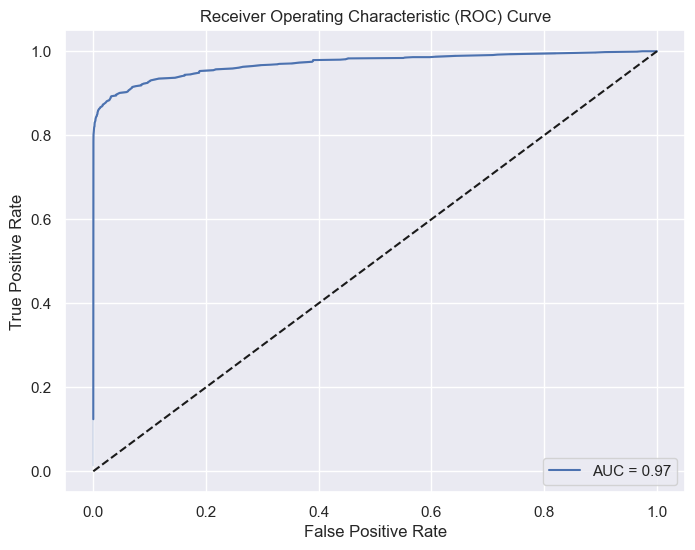

In [52]:
# Plot the ROC curve
plt.figure(figsize=(8, 6))
sns.lineplot(x=fpr, y=tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random classification
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [54]:
importances = lgbm_best.feature_importances_
feature_names= X_train.columns

for feature, importance in zip(feature_names, importances):
    print(f'{feature} : {importance}')

Type : 1791
Air_temperature_K : 12574
Process_temperature_K : 14027
Rotational_speed_rpm : 13631
Torque_Nm : 14115
Tool_wear_min : 14118
TWF : 115
HDF : 65
PWF : 126
OSF : 113
RNF : 23


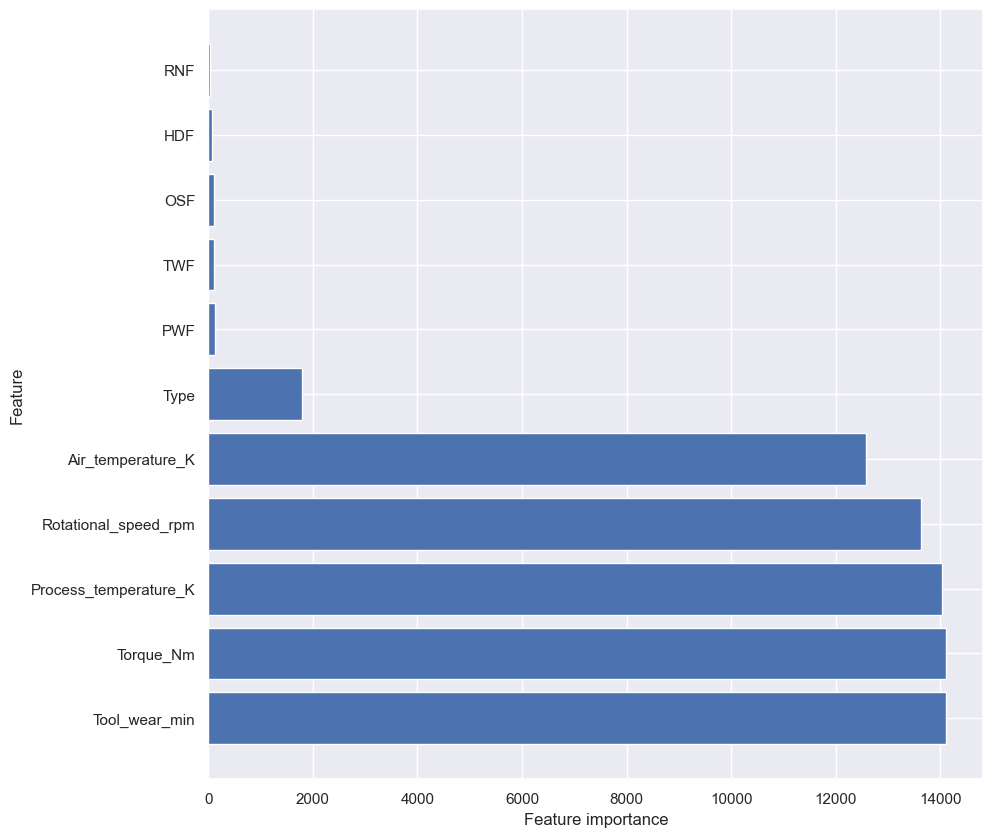

In [55]:
# Create a list of (feature, importance) tuples
feature_importances = [(feature, importance) for feature, importance in zip(feature_names, importances)]

# Sort the feature importances by importance
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

# Extract the feature names and importances
feature_names, importances = zip(*feature_importances)

# Plot the feature importances
plt.figure(figsize=(10,10))
plt.barh(range(len(feature_names)), importances, align='center')
plt.yticks(range(len(feature_names)), feature_names)
plt.xlabel("Feature importance")
plt.ylabel("Feature")
plt.show()

<h3><b>Applying the lgbm with best hyperparameters on the test dataset</b></h3>

In [56]:
test.head()

,id,Product ID,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,TWF,HDF,PWF,OSF,RNF
0,136429,L50896,1,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,1,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,1,301.3,310.4,1525,37.7,96,0,0,0,0,0
3,136432,M21232,2,300.1,309.6,1479,47.6,5,0,0,0,0,0
4,136433,M19751,2,303.4,312.3,1515,41.3,114,0,0,0,0,0


In [57]:
X_Test = test.drop(columns=["id", "Product ID"], axis=1)
X_Test.head()

,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,TWF,HDF,PWF,OSF,RNF
0,1,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,1,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,1,301.3,310.4,1525,37.7,96,0,0,0,0,0
3,2,300.1,309.6,1479,47.6,5,0,0,0,0,0
4,2,303.4,312.3,1515,41.3,114,0,0,0,0,0


In [58]:
pred = lgbm_best.predict_proba(X_Test)[:, 1]
pred

array([0.00375044, 0.00710621, 0.00388758, ..., 0.00401334, 0.00410763,
       0.0045512 ])

In [59]:
output = pd.DataFrame({'id':test.id, 'Machine failure':pred})
output.to_csv('Machine_Failure.csv',index=False)
print("Your submission was successfully saved")

Your submission was successfully saved
